In [1]:
import yaml
import netCDF4 as nc
import numpy as np
import torch
import pandas as pd

%matplotlib inline
from mpl_toolkits.basemap import Basemap
import matplotlib.pyplot as plt

from utils.read_data import *
from utils.param_alpha import get_alpha, get_complex_alpha, compute_alpha_whole_trajectory,compute_alpha_matrix, get_alpha_averaged, update_alpha_GD, update_alpha_GD_stockes, compute_alpha_succesive_position
from models.linear_model import u_drift_linear, u_drift_linear_complex, u_drift_linear_matrix
from utils.RK4 import RK4_step, compute_position
from data_driven.compute_trajectory_hybrid import compute_trajectory_hybrid, compute_trajectory_hybrid_w_history
from models.stockes_model import u_drift_ocean_wind_stockes_matrix, u_drift_ocean_stockes_matrix,u_drift_stockes_only


In [2]:
'''with open('configs_2/trace_ISMER_20140706_spot073_drift.yml', 'r') as f:
    config = yaml.safe_load(f)'''

with open('../configs/configs_NOAA/test/config_traj_300234065417160.yml', 'r') as f:
    config = yaml.safe_load(f)

checkpoint_path_K = '../checkpoints/NOAA/gridsearch/lightning_logs/version_31/checkpoints/epoch=136-step=232215.ckpt'
checkpoint_path_N = '../checkpoints/NOAA/newloss/lightning_logs/version_16/checkpoints/epoch=123-step=210180.ckpt'
checkpoint_path_P = '../checkpoints/NOAA/newloss/lightning_logs/version_23/checkpoints/epoch=135-step=195976.ckpt'
checkpoint_path_L = '../checkpoints/NOAA/lightning_logs/version_25/checkpoints/epoch=146-step=245931.ckpt'
checkpoint_path_M = '../checkpoints/NOAA/pt64/lightning_logs/version_1/checkpoints/epoch=148-step=252555.ckpt'
checkpoint_path_O = '../checkpoints/NOAA/gridsearch_w_history/lightning_logs/version_71/checkpoints/epoch=88-step=131898.ckpt'

In [3]:

'''config['ch1'] = 32
config['ch2'] = 16'''

"config['ch1'] = 32\nconfig['ch2'] = 16"

Physical solution

In [4]:
pos_1, time1 = get_initial_position(config['PATH_DRIFT'], NOAA=True) 

print(pos_1,time1)
true_lon, true_lat, true_time = get_true_drift_positions(config['PATH_DRIFT'],NOAA=True)

# Get interpolated initial data
u10_interpolation, v10_interpolation = wind_interpolated(config['PATH_WIND'])
water_u_interpolation, water_v_interpolation = water_interpolated(config['PATH_WATER'])
ust_interpolation, vst_interpolation = wave_interpolated(config['PATH_WAVES'])

alpha = update_alpha_GD(config['PATH_DRIFT'], water_u_interpolation, water_v_interpolation, u10_interpolation, v10_interpolation,alpha = 0.03, theta = 0.349066,  step=1, npoints=3, NOAA=True)
alpha_stockes = update_alpha_GD_stockes(config['PATH_DRIFT'], water_u_interpolation, water_v_interpolation, u10_interpolation, v10_interpolation, ust_interpolation, vst_interpolation, alpha = 0.03, theta = 0.349066,  step=1, npoints=3, NOAA = True)

u_drift = u_drift_linear_matrix(alpha, u10_interpolation, v10_interpolation,water_u_interpolation,water_v_interpolation)

#u_stokes = u_drift_ocean_wind_stockes_matrix(alpha_stockes, u10_interpolation, v10_interpolation,water_u_interpolation,water_v_interpolation, ust_interpolation, vst_interpolation)

longitudes, latitudes, time_final = compute_position(u_drift, pos_1, time1,1,10)

#longitudes_stokes, latitudes_stokes, time_final = compute_position(u_stokes, pos_1, time1,1,72)


[ 20.11287 -35.32462] 160808.0


Data-Driven Solution

In [4]:
config['checkpoint_test'] = checkpoint_path_K
config['d_context'] = 50
config['npoints'] = 32
longitudes_K, latitudes_K = compute_trajectory_hybrid(config,10, NOAA=True)

100%|██████████| 10/10 [00:26<00:00,  2.65s/it]


In [5]:
config['checkpoint_test'] = checkpoint_path_L
config['d_context'] = 100
config['npoints'] = 32
longitudes_L, latitudes_L = compute_trajectory_hybrid(config,10, NOAA=True)

  0%|          | 0/10 [00:00<?, ?it/s]

100%|██████████| 10/10 [00:26<00:00,  2.62s/it]


In [3]:
config['checkpoint_test'] = checkpoint_path_M
config['d_context'] = 50
config['npoints'] = 64
longitudes_M, latitudes_M = compute_trajectory_hybrid(config,72, NOAA=True)

100%|██████████| 72/72 [05:14<00:00,  4.37s/it]


In [4]:
with open('longlatM.npy', 'wb') as f:

    np.save(f, longitudes_M)
    np.save(f, latitudes_M)


In [23]:

with open('longlatM.npy', 'rb') as f:

    longitudes_M = np.load(f)

    latitudes_M = np.load(f)

In [35]:
longitudes_M = longitudes_M[:10]
latitudes_M = latitudes_M[:10]

In [8]:
config['checkpoint_test'] = checkpoint_path_N
config['d_context'] = 50
config['npoints'] = 32
longitudes_dd_N, latitudes_dd_N = compute_trajectory_hybrid(config,10, NOAA=True)

  0%|          | 0/10 [00:00<?, ?it/s]

100%|██████████| 10/10 [00:26<00:00,  2.60s/it]


In [9]:
config['checkpoint_test'] = checkpoint_path_O
config['d_context'] = 50
config['npoints'] = 32
longitudes_O, latitudes_O = compute_trajectory_hybrid_w_history(config,10, NOAA=True)

100%|██████████| 10/10 [00:23<00:00,  2.34s/it]


In [10]:
config['checkpoint_test'] = checkpoint_path_P
config['d_context'] = 50
config['npoints'] = 32
longitudes_dd_traj, latitudes_dd_traj = compute_trajectory_hybrid(config,10, NOAA=True)

  0%|          | 0/10 [00:00<?, ?it/s]

100%|██████████| 10/10 [00:25<00:00,  2.60s/it]


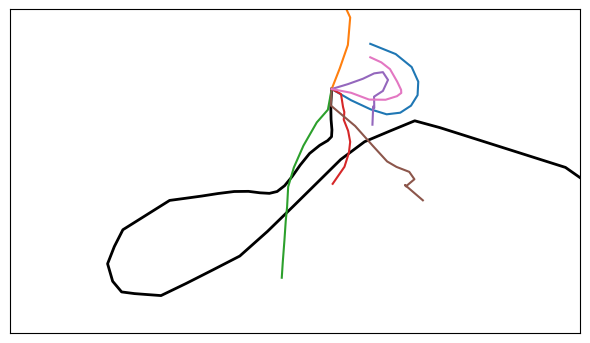

In [36]:
# setting the size of the map
fig = plt.figure(figsize=(6,4.3))

# creating the map - setting latitude and longitude
#m = Basemap(projection = 'mill', llcrnrlat = 46, urcrnrlat = 50, llcrnrlon = -71, urcrnrlon = -63, resolution = 'i') #august2015
m = Basemap(projection = 'mill', llcrnrlat = config['min_lat'], urcrnrlat = config['max_lat'], llcrnrlon = config['min_lon'], urcrnrlon = config['max_lon'], resolution = 'i') 
#m = Basemap(projection = 'mill', llcrnrlat = 48, urcrnrlat = 52, llcrnrlon = -60, urcrnrlon = -56, resolution = 'i') #july2014
#m = Basemap(projection = 'mill', llcrnrlat = 46, urcrnrlat = 50, llcrnrlon = -65, urcrnrlon = -59, resolution = 'i') #oct2014

# drawing the coastline
m.drawcoastlines()
m.drawcountries(color='gray')
m.drawstates(color='gray')
m.drawcoastlines()
m.fillcontinents()


# plotting the map
#m.scatter(lon, lat, latlon = True, s = 10, c = 'red', marker = '.', alpha = 1)
m.plot(true_lon,true_lat,latlon=True,linewidth=2,color='k', label='True trajectory')
#m.scatter(true_lon[0],true_lat[0], latlon=True,s=10,color='g',marker ='o',alpha=1)

m.plot(longitudes,latitudes,latlon=True,linewidth=1.5,color='tab:blue', label='Model A')
m.plot(longitudes_K,latitudes_K,latlon=True,linewidth=1.5,color='tab:orange', label='Model K')
m.plot(longitudes_L,latitudes_L,latlon=True,linewidth=1.5,color='tab:green', label='Model L')
m.plot(longitudes_M,latitudes_M,latlon=True,linewidth=1.5,color='tab:red', label='Model M')
m.plot(longitudes_dd_N,latitudes_dd_N,latlon=True,linewidth=1.5,color='tab:purple', label='Model N')
m.plot(longitudes_O,latitudes_O,latlon=True,linewidth=1.5,color='tab:brown', label='Model O')
m.plot(longitudes_dd_traj,latitudes_dd_traj,latlon=True,linewidth=1.5,color='tab:pink', label='Model P')
#m.plot(longitudes_dd_2,latitudes_dd_2,latlon=True,linewidth=1.5,color='tab:pink', label='Hybrid model (angle corrected)')

#plot grid ocean
#m.scatter(test_mesh_lon,test_meah_lat,latlon=True,s=10,color='k',marker ='+',alpha=0.5, label='Grid for wind data')

m.drawmapscale(config['min_lon']+0.4, config['min_lat']+1, config['min_lon'], config['min_lat'], 50, barstyle='fancy')

#plt.legend(loc = 'lower right',framealpha=1)
plt.show()

#plt.tight_layout()
#plt.savefig('figures/traces_all_models.eps', format='eps')
#plt.savefig('figures/traces_all_models.png')


In [29]:
import matplotlib

font = {'size'   : 15,
        'weight': 'normal',
        'family': 'serif'}

matplotlib.rc('font', **font)

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


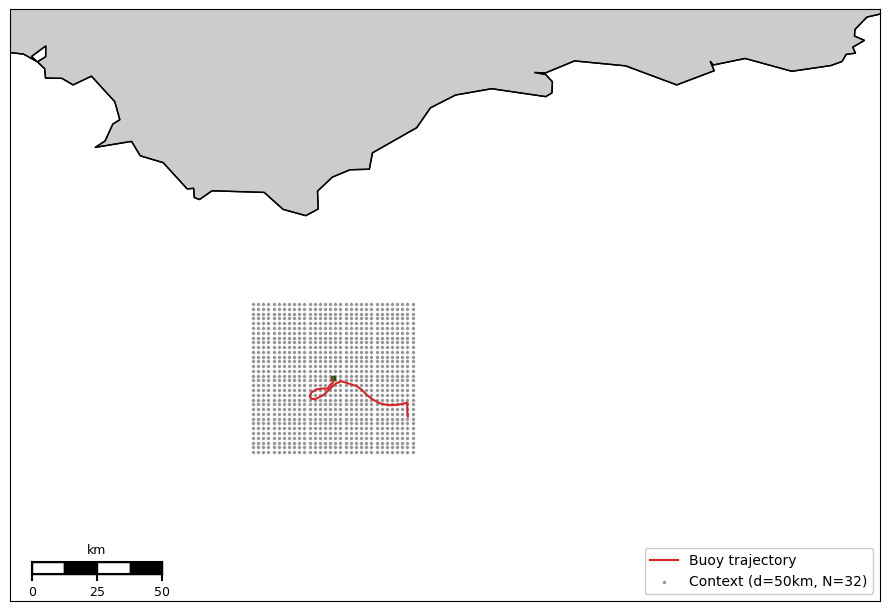

In [6]:
### Pas mal avec cette trace: 
'''with open('../configs/configs_NOAA/test/config_traj_300234065417160.yml', 'r') as f:
    config = yaml.safe_load(f)

checkpoint_path = '../checkpoints/NOAA/gridsearch/lightning_logs/version_31/checkpoints/epoch=136-step=232215.ckpt'''

from utils.convert_lats import *

[lon_init,lat_init] = pos_1
d_m = 50*1000
npoints = 32

lat_max = new_latitude(lat_init, lon_init, d_m/2)
lat_min = new_latitude(lat_init, lon_init, -d_m/2)
lon_max = new_longitude(lat_init, lon_init, d_m/2)
lon_min = new_longitude(lat_init, lon_init, -d_m/2)

# get grid 
lats = np.linspace(lat_min, lat_max, npoints)
lons = np.linspace(lon_min, lon_max, npoints)

test_mesh_lon, test_meah_lat = np.meshgrid(lons,lats)

ds_water = nc.Dataset(config['PATH_WATER'])
ds_wind = nc.Dataset(config['PATH_WIND'])

lon_water = ds_water.variables['lon']
lon_water = lon_water[:].data
lat_water = ds_water.variables['lat']
lat_water = lat_water[:].data


lon_wind = ds_wind.variables['longitude']
lon_wind = lon_wind[:].data
lat_wind = ds_wind.variables['latitude']
lat_wind = lat_wind[:].data


gridx_water,gridy_water = np.meshgrid(lon_water,lat_water)
gridx_wind,gridy_wind = np.meshgrid(lon_wind,lat_wind)

# setting the size of the map
fig = plt.figure(figsize=(9,7))

# creating the map - setting latitude and longitude
#m = Basemap(projection = 'mill', llcrnrlat = 46, urcrnrlat = 50, llcrnrlon = -71, urcrnrlon = -63, resolution = 'i') #august2015
m = Basemap(projection = 'mill', llcrnrlat = config['min_lat']+1, urcrnrlat = config['max_lat']-0.2, llcrnrlon = config['min_lon'], urcrnrlon = config['max_lon'], resolution = 'i') 
#m = Basemap(projection = 'mill', llcrnrlat = 48, urcrnrlat = 52, llcrnrlon = -60, urcrnrlon = -56, resolution = 'i') #july2014
#m = Basemap(projection = 'mill', llcrnrlat = 46, urcrnrlat = 50, llcrnrlon = -65, urcrnrlon = -59, resolution = 'i') #oct2014

# drawing the coastline
m.drawcoastlines()
m.drawcountries(color='gray')
m.drawstates(color='gray')
m.drawcoastlines()
m.fillcontinents()


# plotting the map
#m.scatter(lon, lat, latlon = True, s = 10, c = 'red', marker = '.', alpha = 1)
m.plot(true_lon,true_lat,latlon=True,linewidth=1.5,color='tab:red', label='Buoy trajectory')
m.scatter(true_lon[0],true_lat[0], latlon=True,s=10,color='g',marker ='o',alpha=1)
#m.plot(longitudes,latitudes,latlon=True,linewidth=1.5,color='tab:blue', label='Physical model')

#m.plot(longitudes_stokes, latitudes_stokes,latlon=True, linewidth=1.5, color ='tab:orange', label = 'Stokes')
#m.plot(longitudes_dd,latitudes_dd,latlon=True,linewidth=1.5,color='g', label='Hybrid model')
#plot grid ocean
#m.scatter(test_mesh_lon,test_meah_lat,latlon=True,s=10,color='k',marker ='+',alpha=0.5, label='Grid for wind data')

m.scatter(test_mesh_lon,test_meah_lat,latlon=True,s=10,color='k',marker ='.',alpha=0.3, label='Context (d=50km, N=32)')
#m.scatter(gridx_water,gridy_water,latlon=True,s=10,color='k',marker ='+',alpha=0.3, label='Resolution of HYCOM data')
#m.scatter(gridx_wind,gridy_wind,latlon=True,s=10,color='k',marker ='o',alpha=0.8, label='Resolution of ERA5 data')


m.drawmapscale(config['min_lon']+0.3, config['min_lat']+1.1, config['min_lon'], config['min_lat'], 50, barstyle='fancy')

plt.legend(loc = 'lower right',framealpha=1)
plt.tight_layout()
plt.savefig('figures/context_area.eps', format='eps')


Opening  trace_ISMER_20150615_spot079_drift.yml


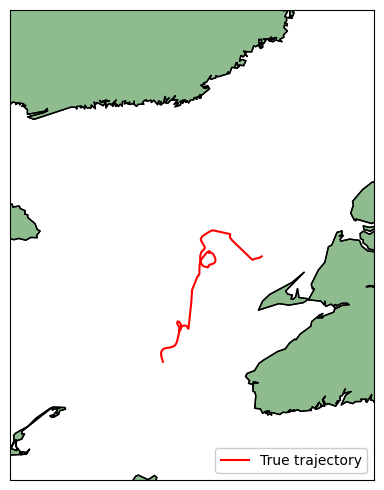

Opening  trace_ISMER_20150809_spot055_drift.yml


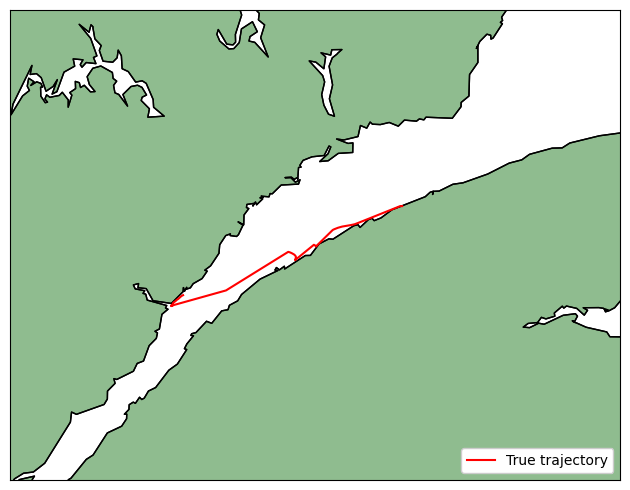

Opening  trace_ISMER_20150616_spot043_drift.yml


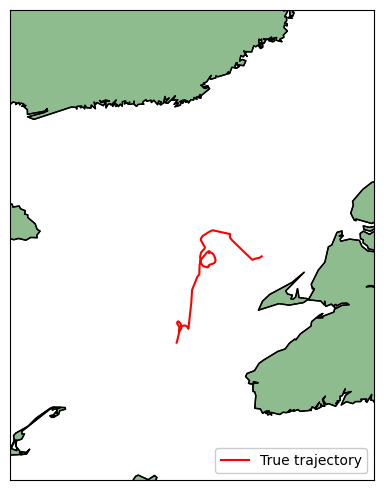

Opening  trace_ISMER_20140702_spot036_drift.yml


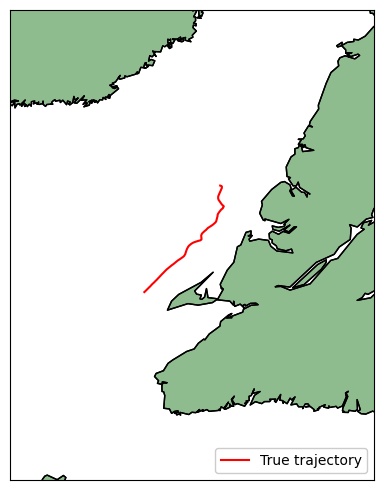

Opening  trace_ISMER_20150619_spot033_drift.yml


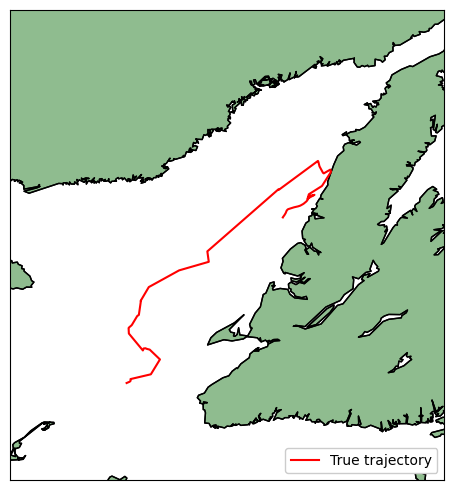

Opening  trace_ISMER_20140706_spot073_drift.yml


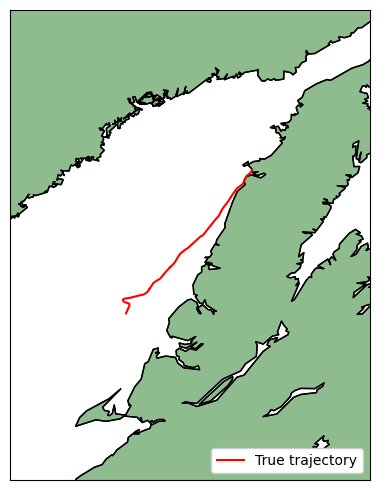

Opening  trace_ISMER_20141022_spot063_drift.yml


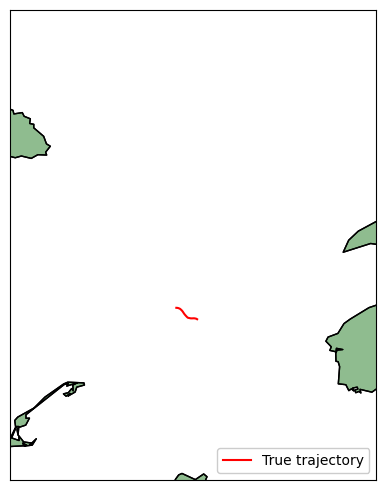

Opening  trace_ISMER_20150624_spot043_drift.yml


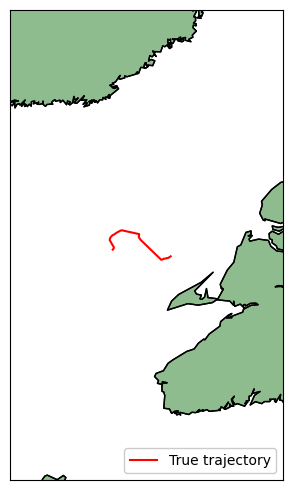

Opening  trace_ISMER_20150613_spot030_drift.yml


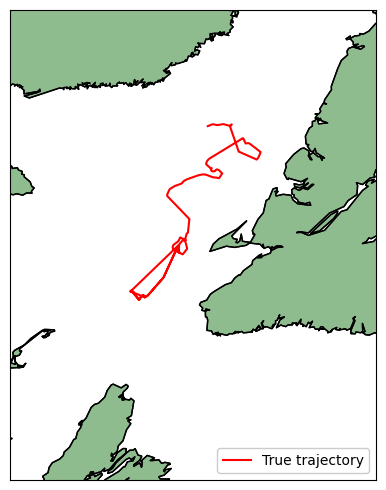

Opening  trace_ISMER_20140702_spot216_drift.yml


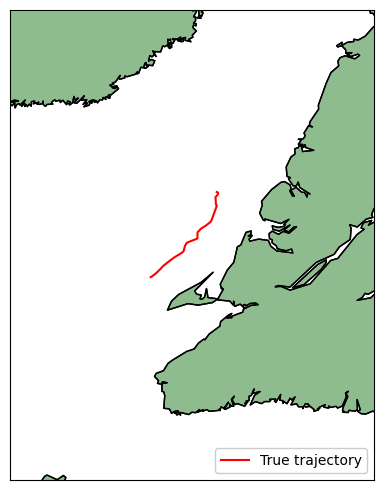

Opening  trace_ISMER_20140709_spot205_drift.yml


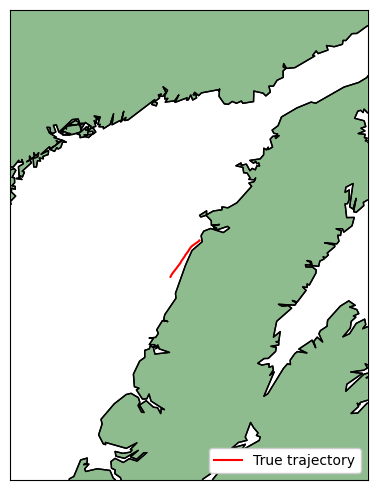

Opening  trace_ISMER_20141027_spot239_drift.yml


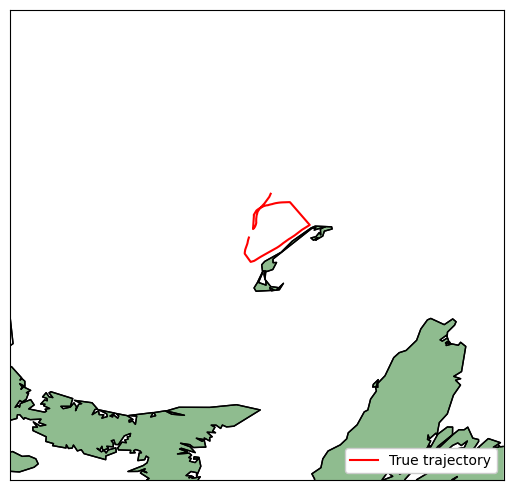

Opening  trace_ISMER_20150619_spot042_drift.yml


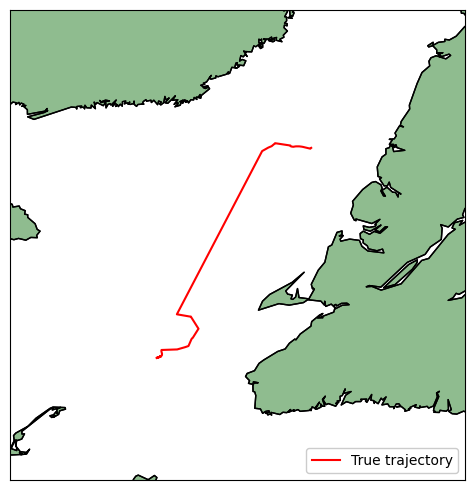

Opening  trace_ISMER_20141022_spot243_drift.yml


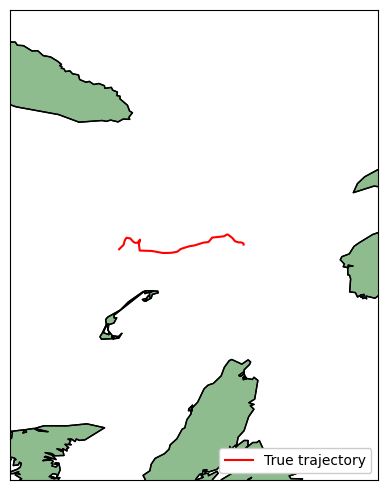

Opening  trace_ISMER_20150925_spot056_drift.yml


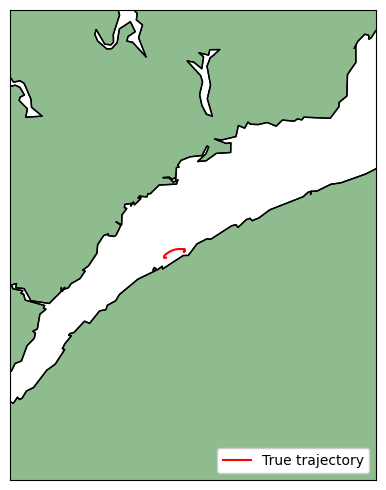

Opening  trace_ISMER_20150924_spot713_drift.yml


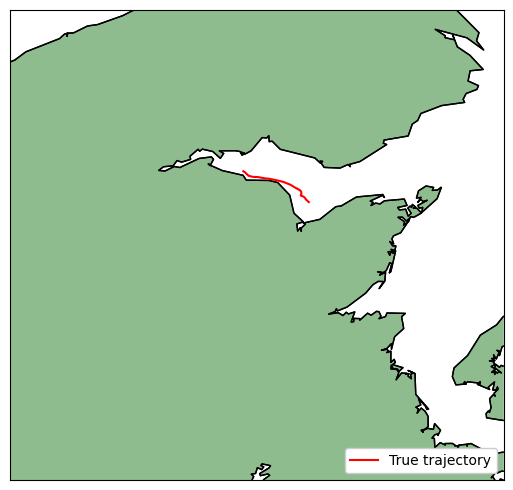

Opening  trace_ISMER_20140909_spot011_drift.yml


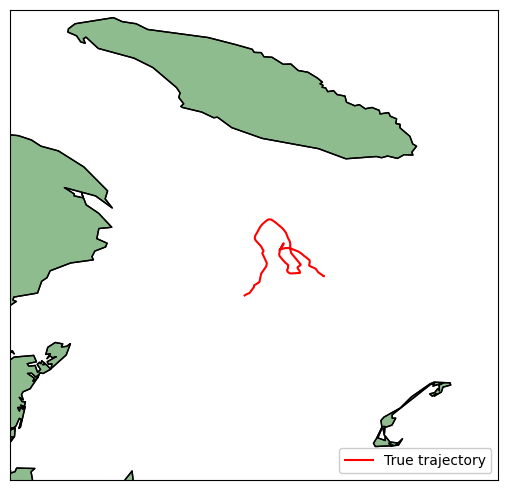

Opening  trace_ISMER_20150809_spot921_drift.yml


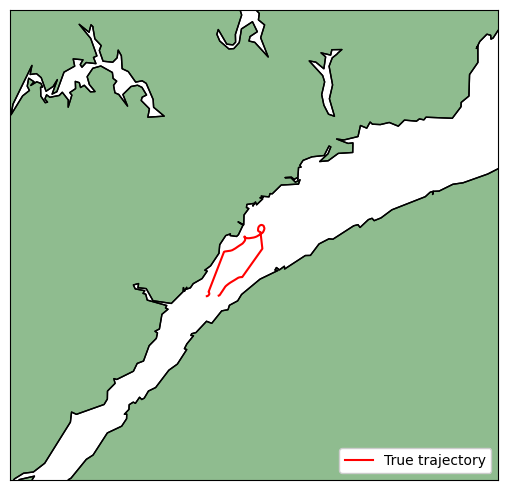

Opening  trace_ISMER_20150921_spot926_drift.yml


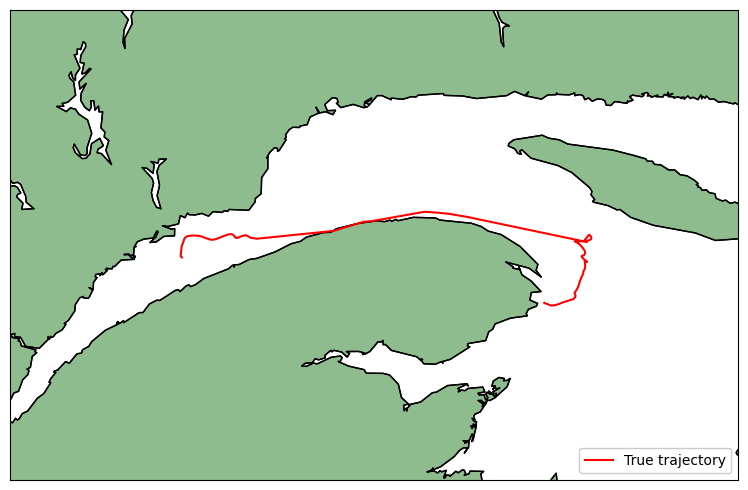

Opening  trace_ISMER_20141021_spot207_drift.yml


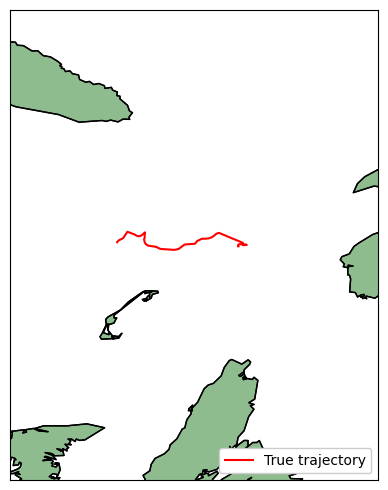

Opening  trace_ISMER_20150809_spot046_drift.yml


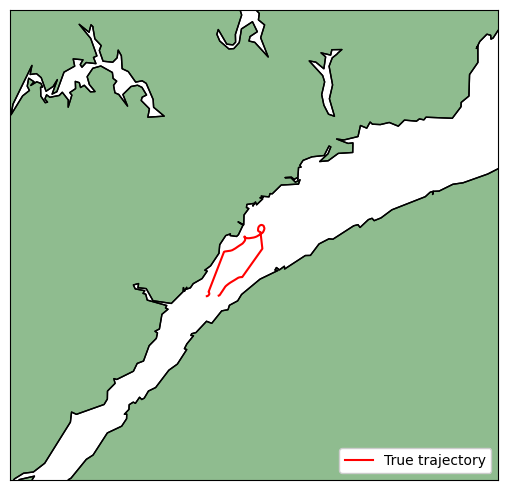

In [1]:
from data_processing.check_data import check_test_set

check_test_set()

In [47]:
import pandas as pd

tab_train = pd.read_csv('../data/nextpoint_ds/contexts/pt32d50/next_point_dataset_train.csv')

In [48]:
tab_train['PATH_CONTEXT'][100]

'../data/nextpoint_ds/contexts/pt32d1/train/trace_ISMER_20150924_spot092_drift_29.npy'

Opening  trace_ISMER_20150809_spot910_drift.yml


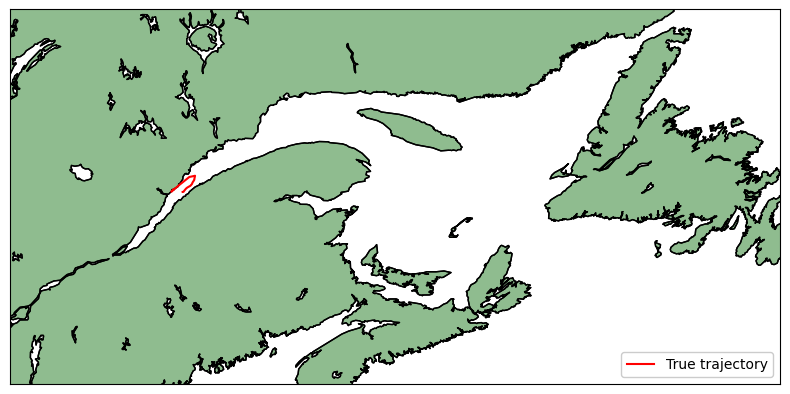

Opening  trace_ISMER_20151103_spot093_drift.yml


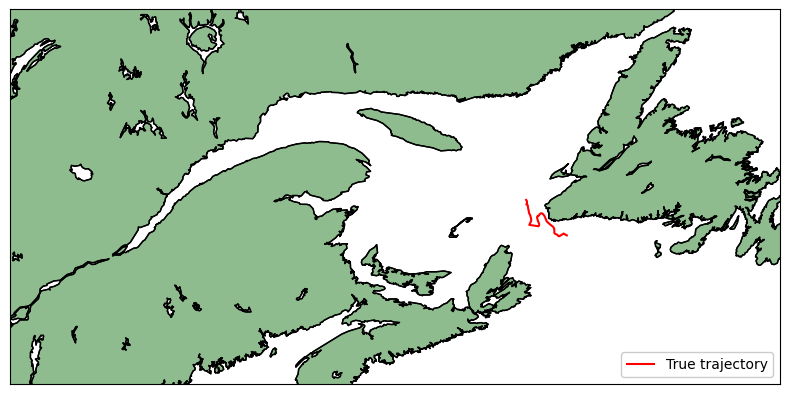

Opening  trace_ISMER_20140923_spot007_drift.yml


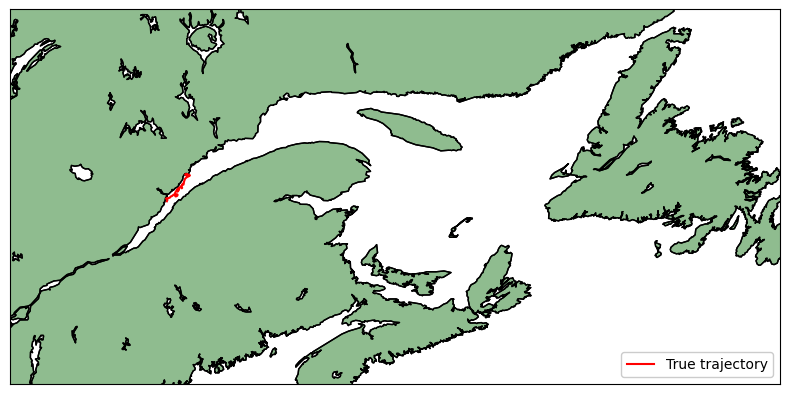

Opening  trace_ISMER_20150921_spot926_drift.yml


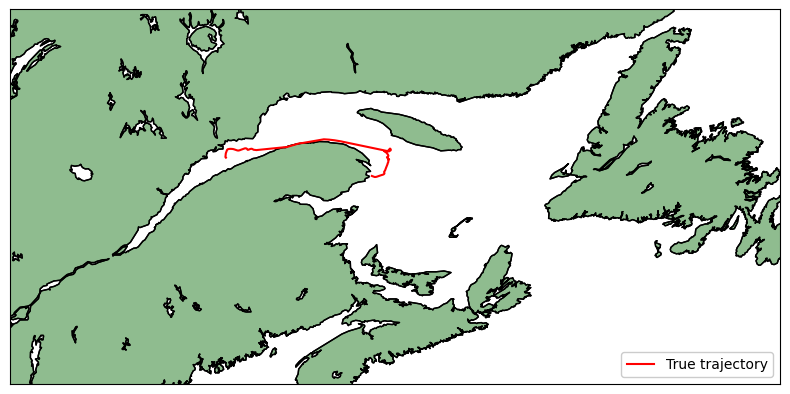

Opening  trace_ISMER_20140706_spot073_drift.yml


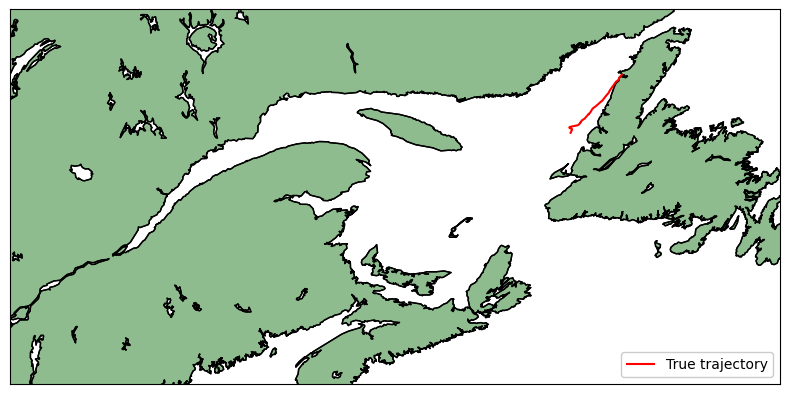

Opening  trace_ISMER_20150809_spot059_drift.yml


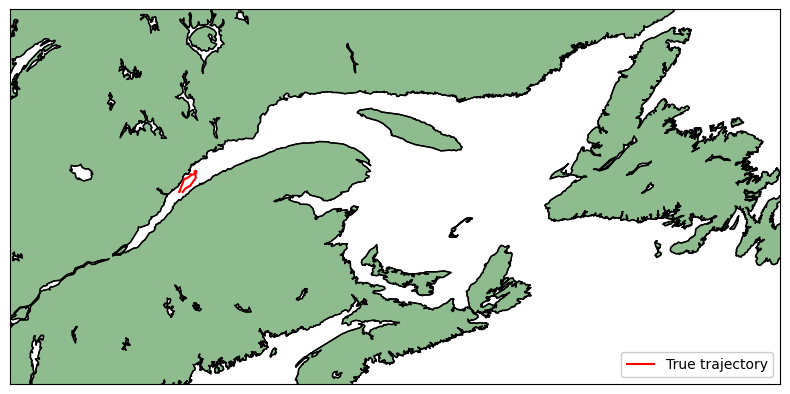

Opening  trace_ISMER_20140706_spot075_drift.yml


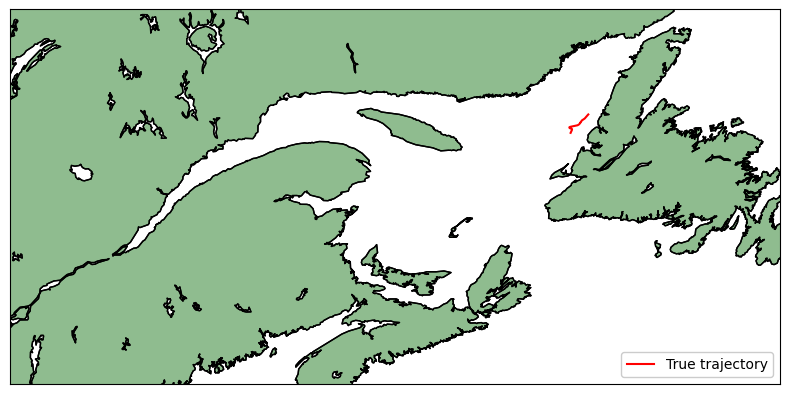

Opening  trace_ISMER_20150927_spot071_drift.yml


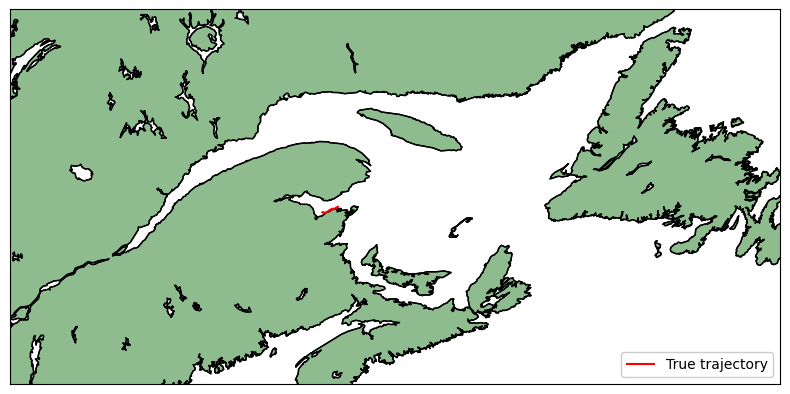

Opening  trace_ISMER_20150612_spot025_drift.yml


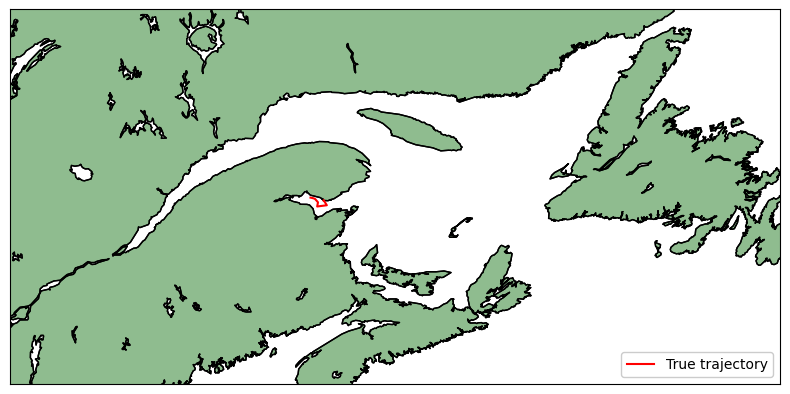

Opening  trace_ISMER_20140903_spot062_drift.yml


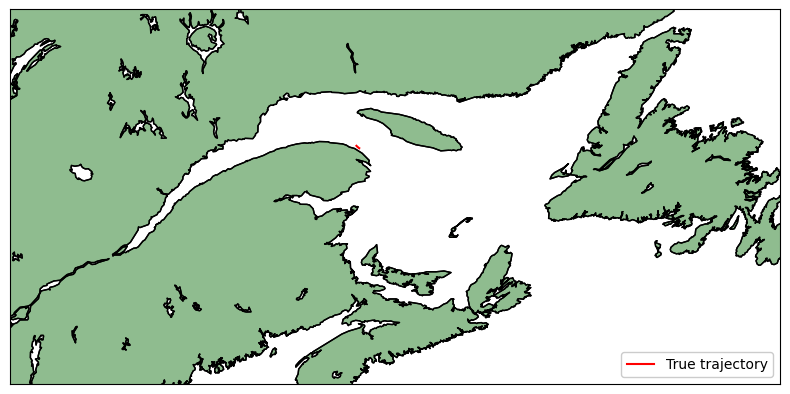

Opening  trace_ISMER_20140704_spot241_drift.yml


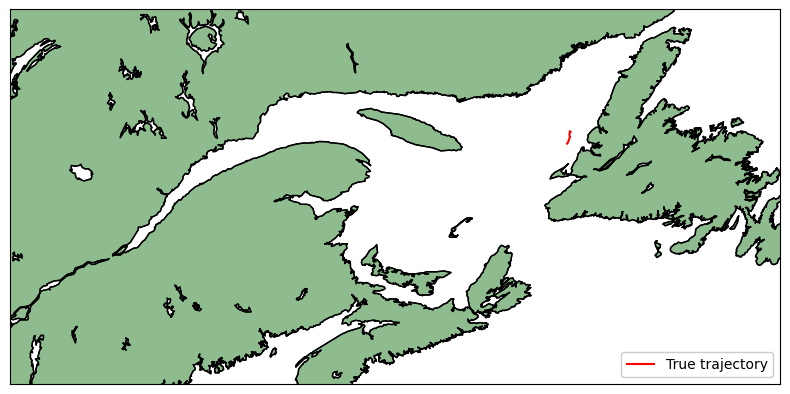

Opening  trace_ISMER_20150613_spot030_drift.yml


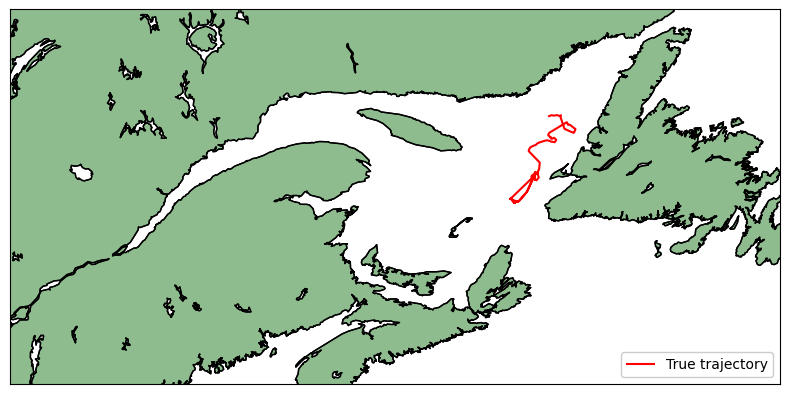

Opening  trace_ISMER_20141024_spot074_drift.yml


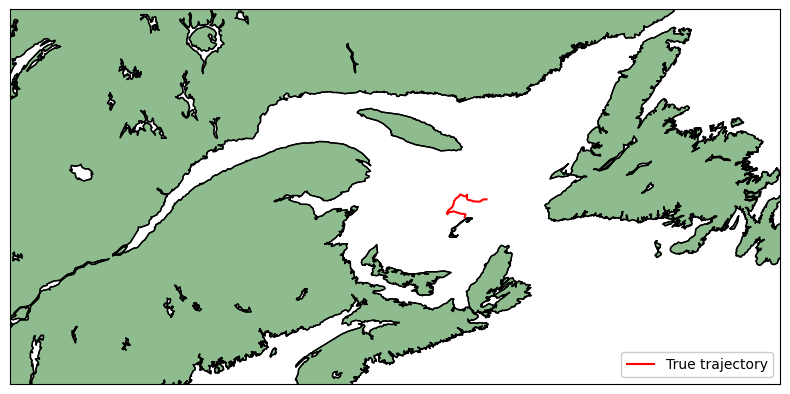

Opening  trace_ISMER_20141027_spot239_drift.yml


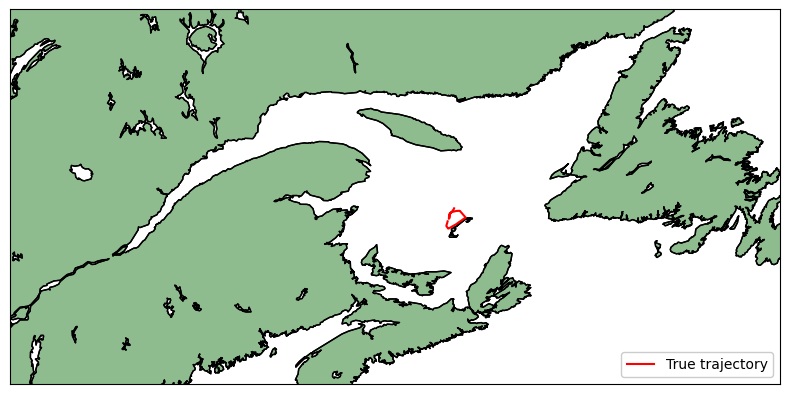

Opening  trace_ISMER_20141021_spot207_drift.yml


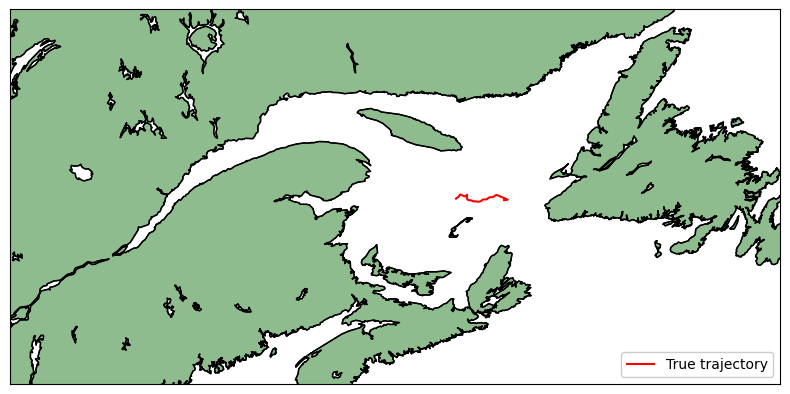

Opening  trace_ISMER_20150924_spot912_drift.yml


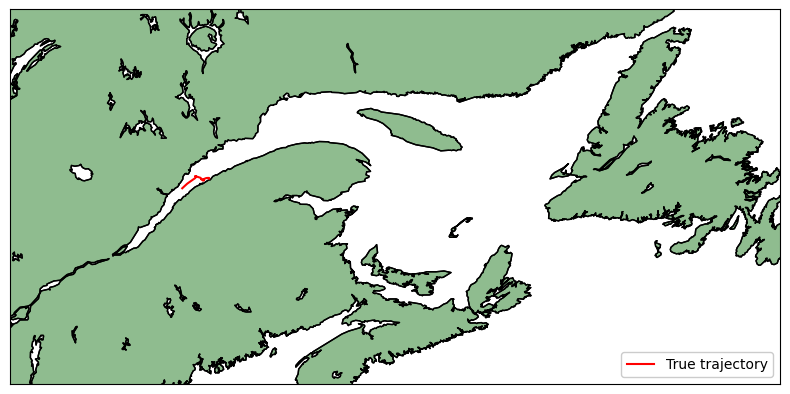

Opening  trace_ISMER_20150723_spot086_drift.yml


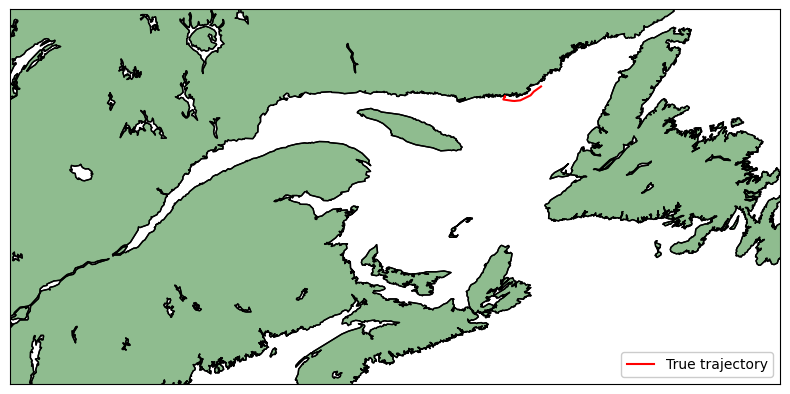

Opening  trace_ISMER_20141022_spot243_drift.yml


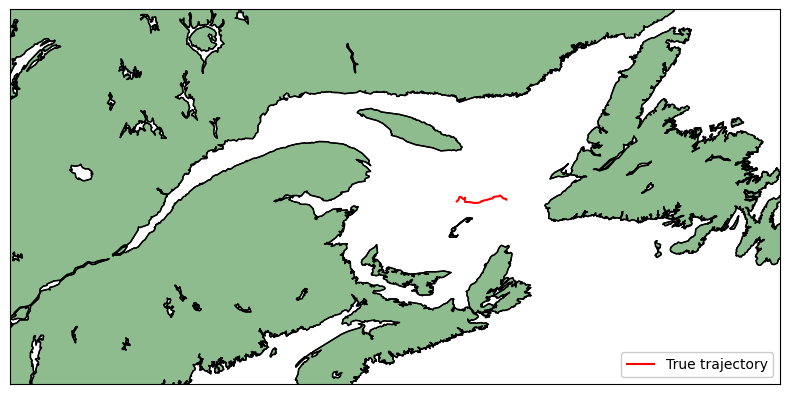

Opening  trace_ISMER_20141024_spot214_drift.yml


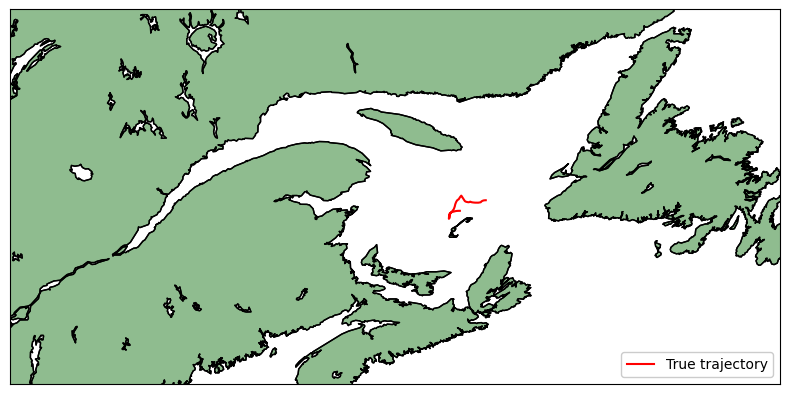

Opening  trace_ISMER_20150809_spot915_drift.yml


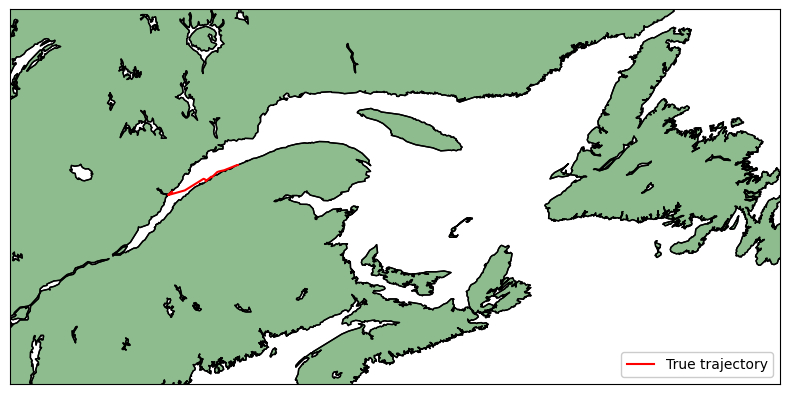

Opening  trace_ISMER_20150805_spot720_drift.yml


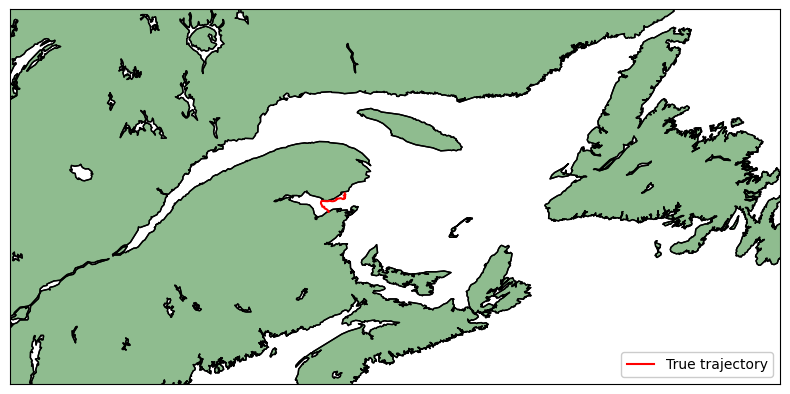

Opening  trace_ISMER_20150809_spot917_drift.yml


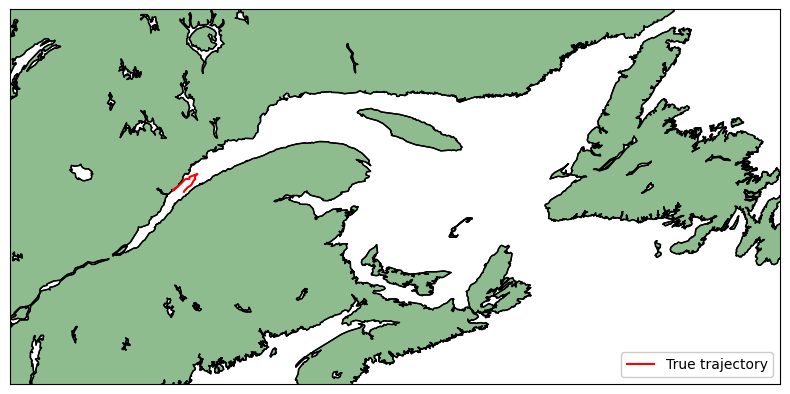

Opening  trace_ISMER_20150616_spot023_drift.yml


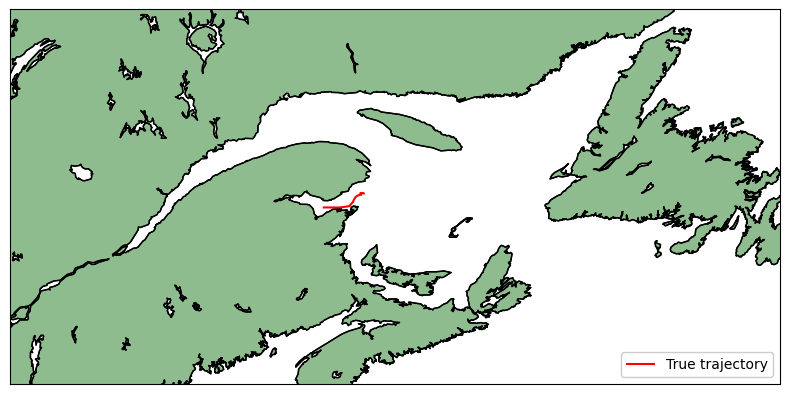

Opening  trace_ISMER_20141027_spot666_drift.yml


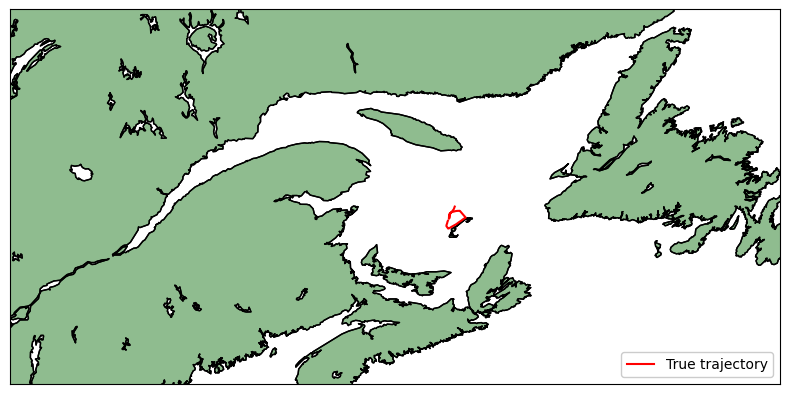

Opening  trace_ISMER_20150924_spot715_drift.yml


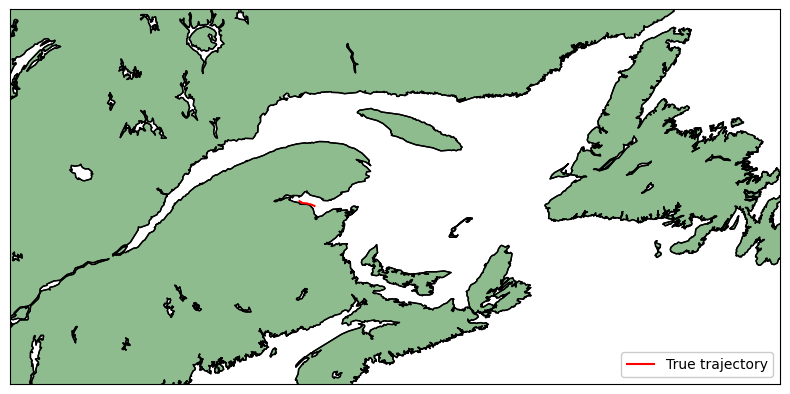

Opening  trace_ISMER_20150626_spot230_drift.yml


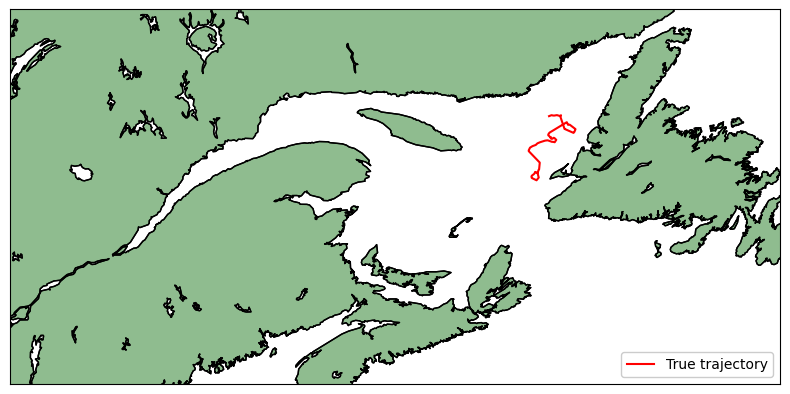

Opening  trace_ISMER_20140706_spot223_drift.yml


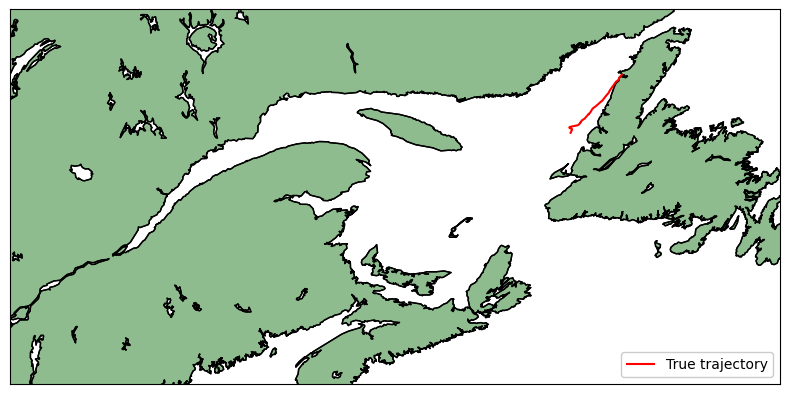

Opening  trace_ISMER_20150616_spot043_drift.yml


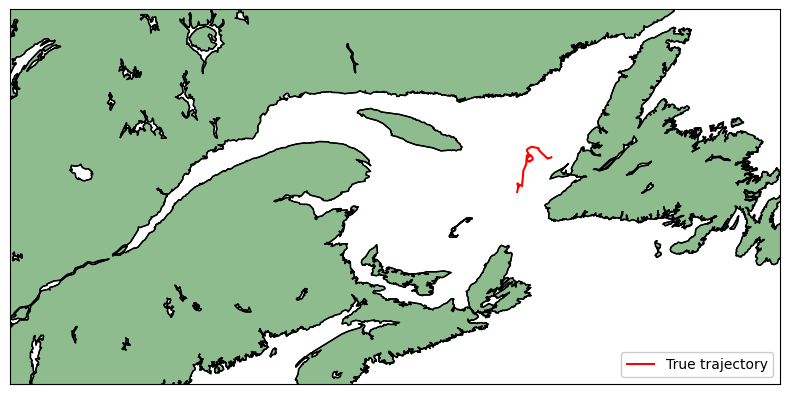

Opening  trace_ISMER_20150925_spot056_drift.yml


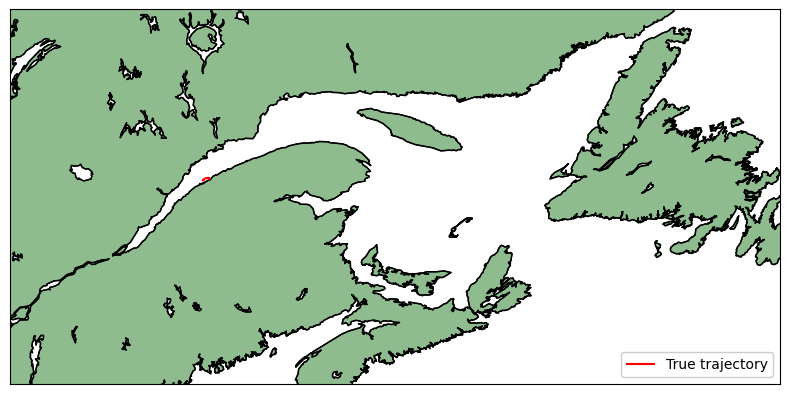

Opening  trace_ISMER_20150809_spot055_drift.yml


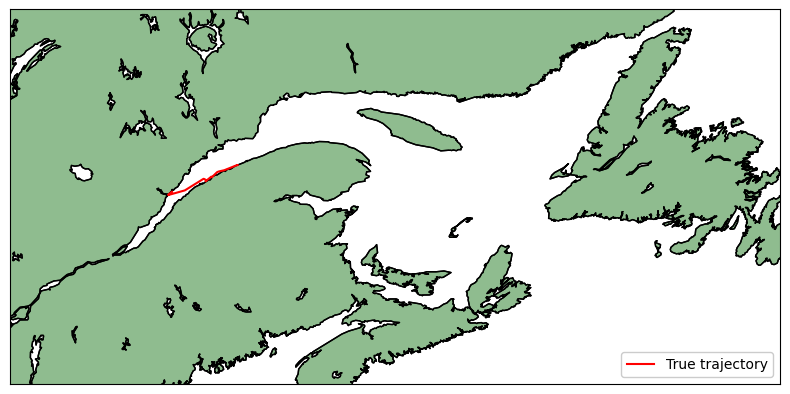

Opening  trace_ISMER_20150619_spot032_drift.yml


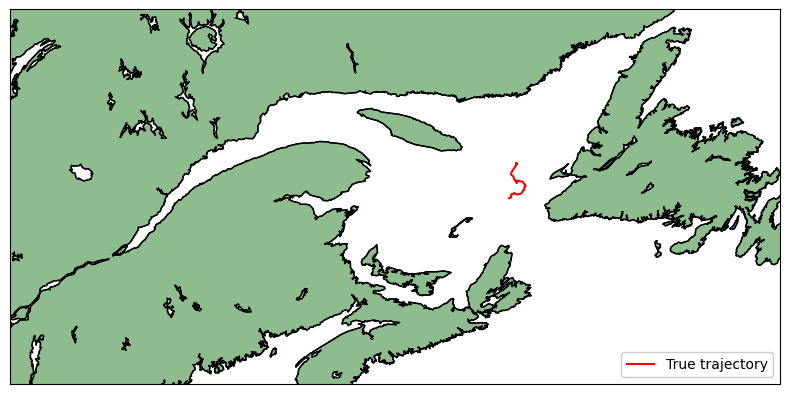

Opening  trace_ISMER_20150924_spot713_drift.yml


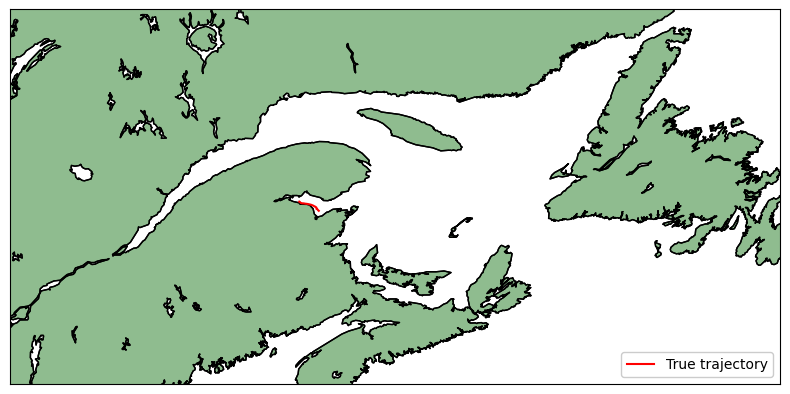

Opening  trace_ISMER_20150924_spot053_drift.yml


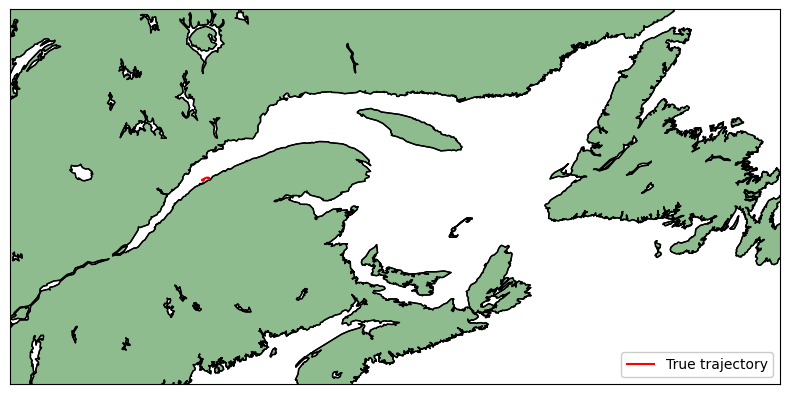

Opening  trace_ISMER_20141024_spot244_drift.yml


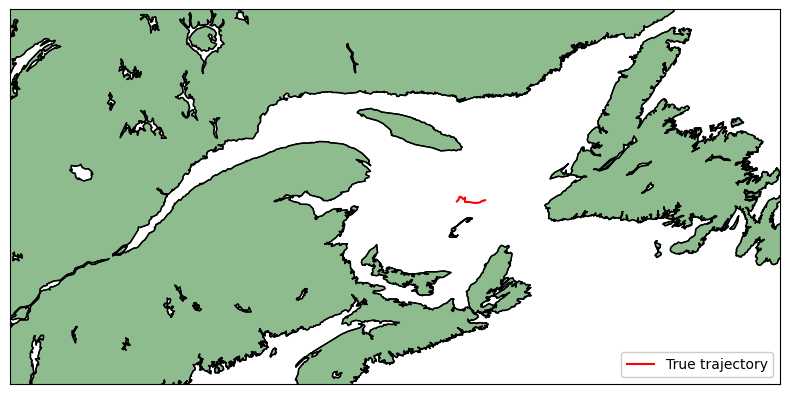

Opening  trace_ISMER_20150605_spot081_drift.yml


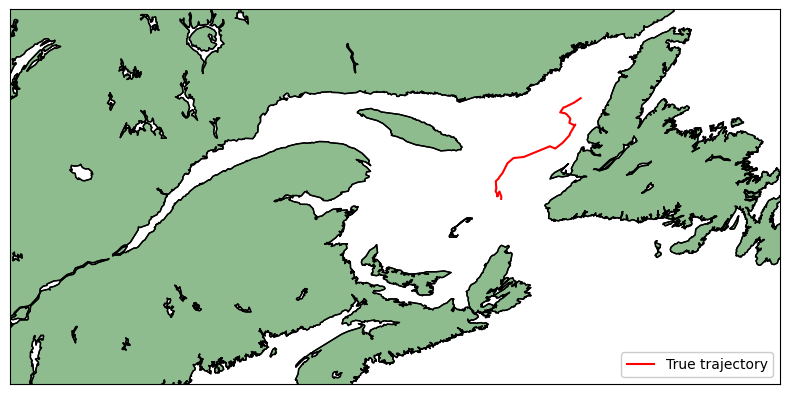

Opening  trace_ISMER_20140909_spot011_drift.yml


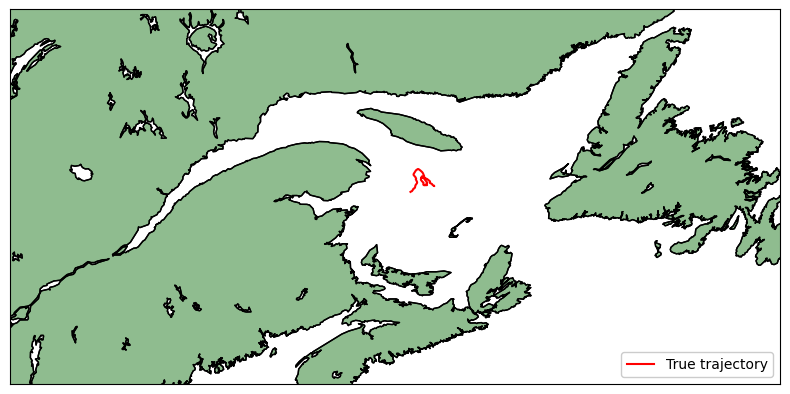

Opening  trace_ISMER_20141029_spot206_drift.yml


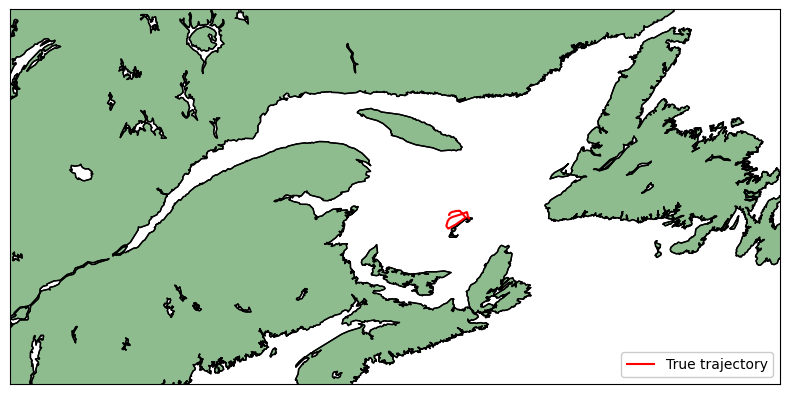

Opening  trace_ISMER_20140811_spot010_drift.yml


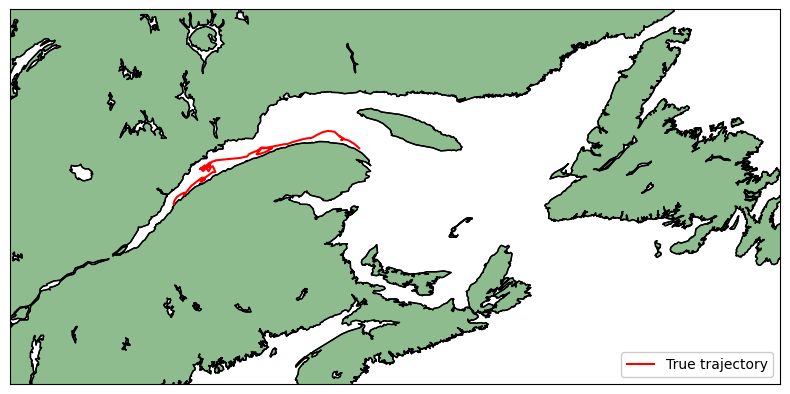

Opening  trace_ISMER_20141024_spot208_drift.yml


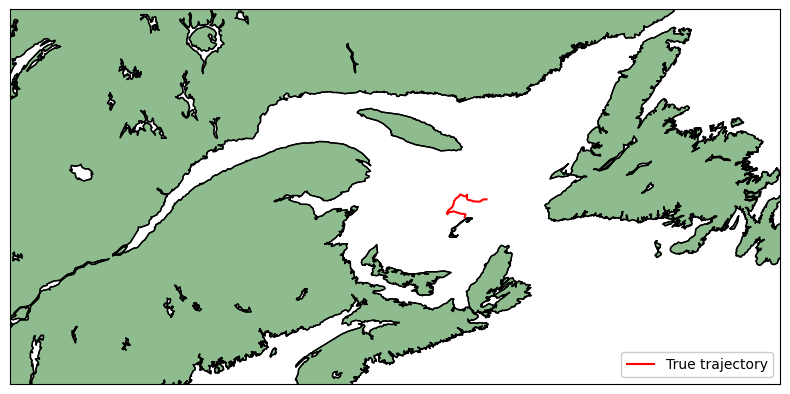

Opening  trace_ISMER_20141021_spot218_drift.yml


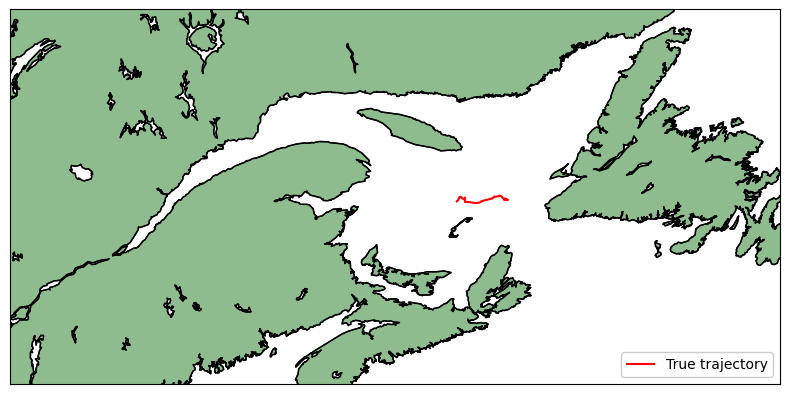

Opening  trace_ISMER_20150612_spot027_drift.yml


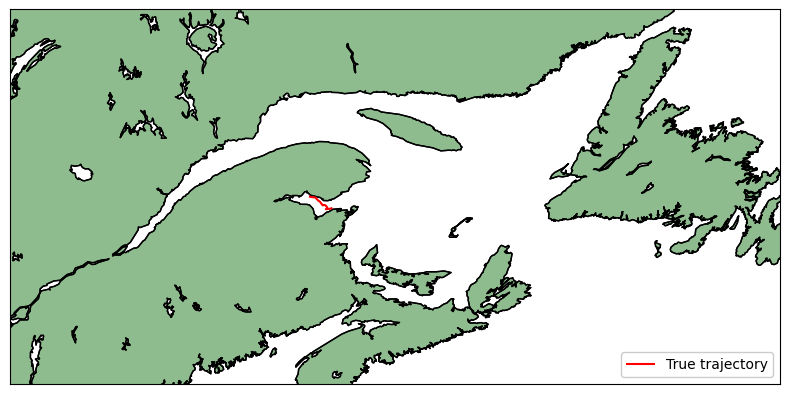

Opening  trace_ISMER_20141027_spot069_drift.yml


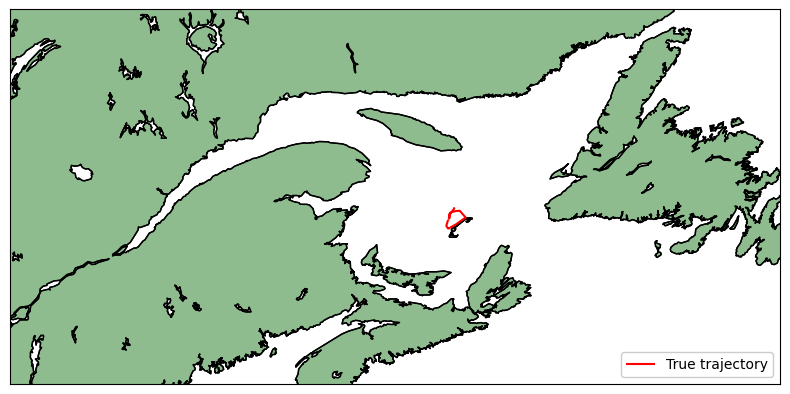

Opening  trace_ISMER_20140702_spot240_drift.yml


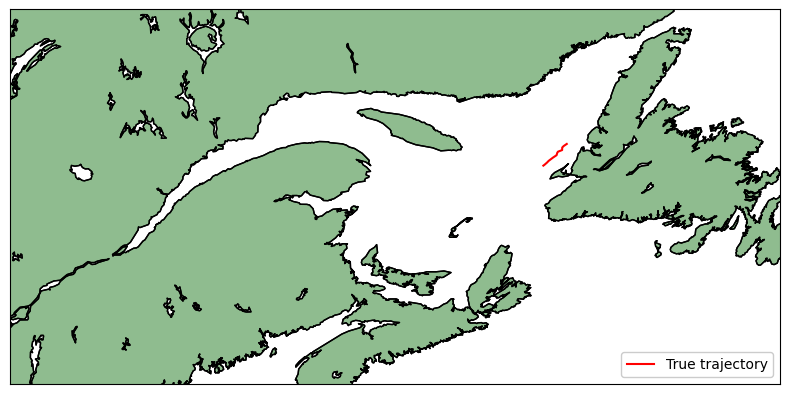

Opening  trace_ISMER_20141027_spot245_drift.yml


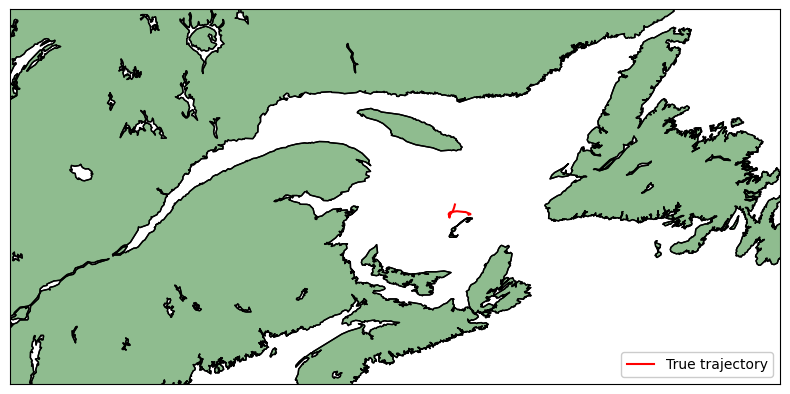

Opening  trace_ISMER_20150805_spot704_drift.yml


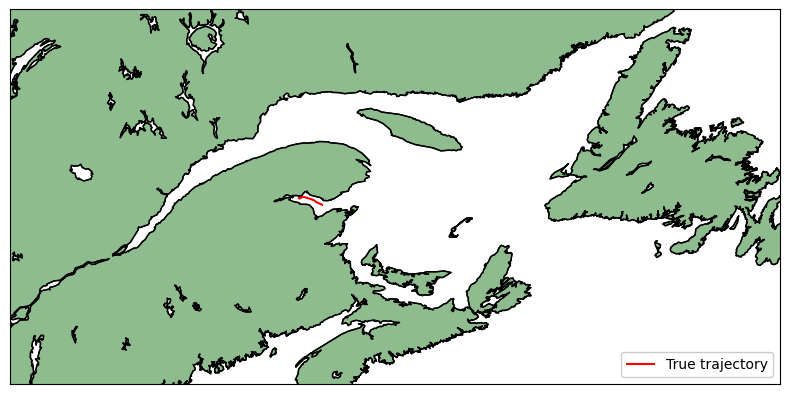

Opening  trace_ISMER_20140629_spot025_drift.yml


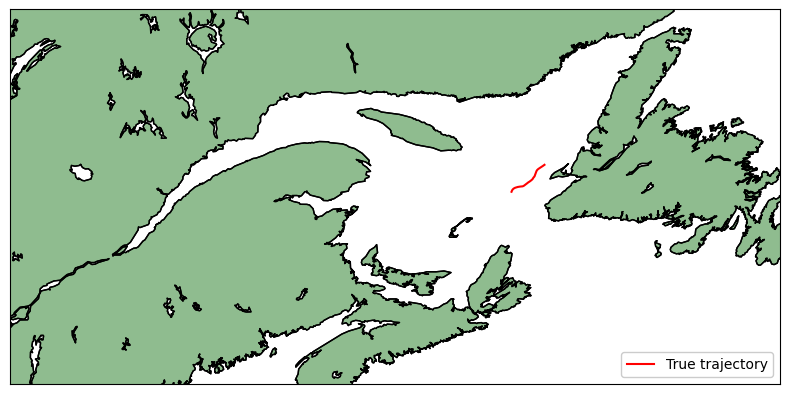

Opening  trace_ISMER_20150924_spot092_drift.yml


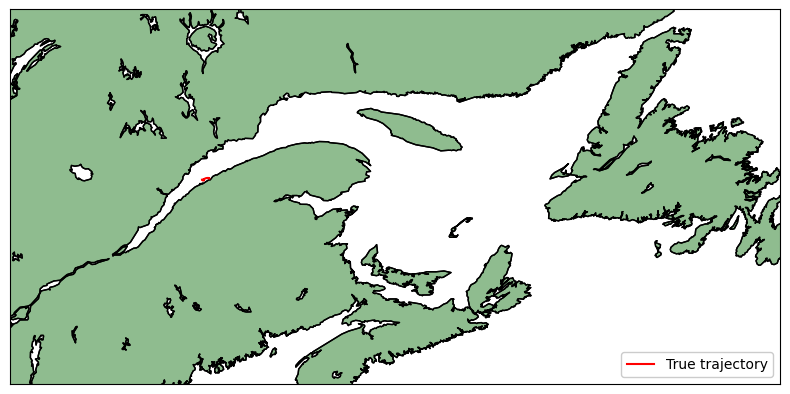

Opening  trace_ISMER_20150809_spot048_drift.yml


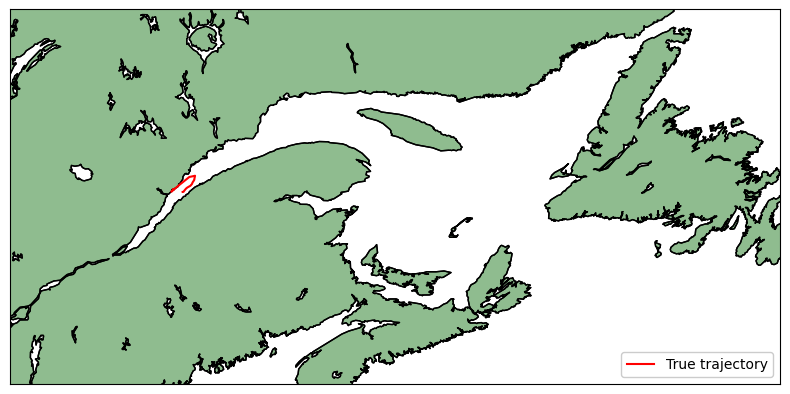

Opening  trace_ISMER_20140923_spot919_drift.yml


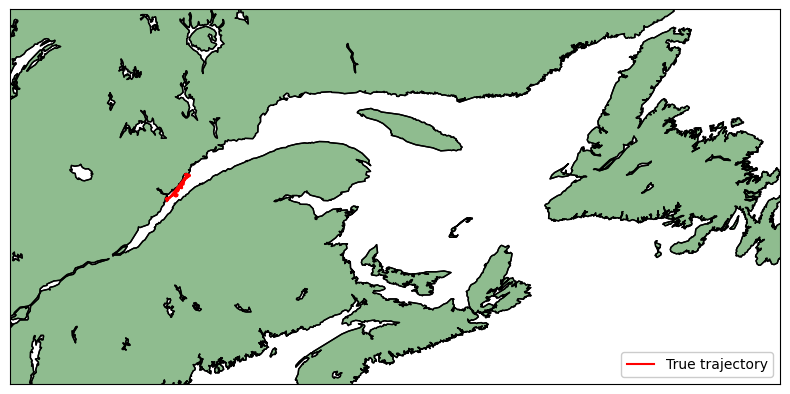

Opening  trace_ISMER_20150811_spot721_drift.yml


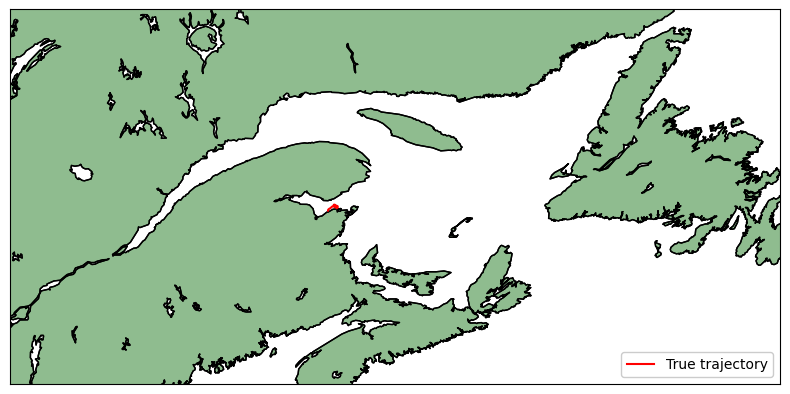

Opening  trace_ISMER_20140910_spot008_drift.yml


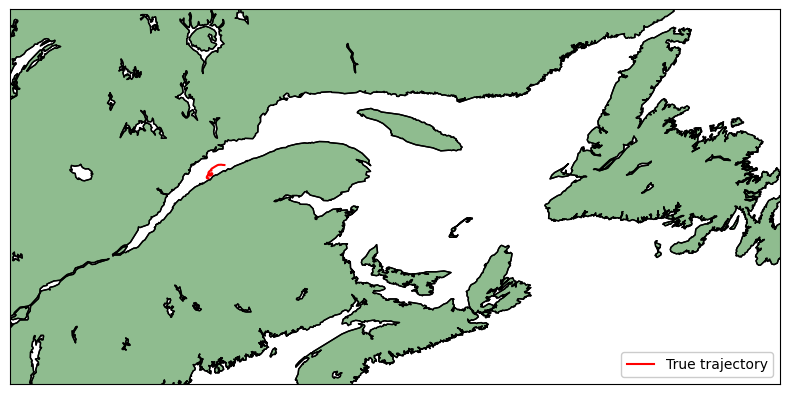

Opening  trace_ISMER_20150809_spot911_drift.yml


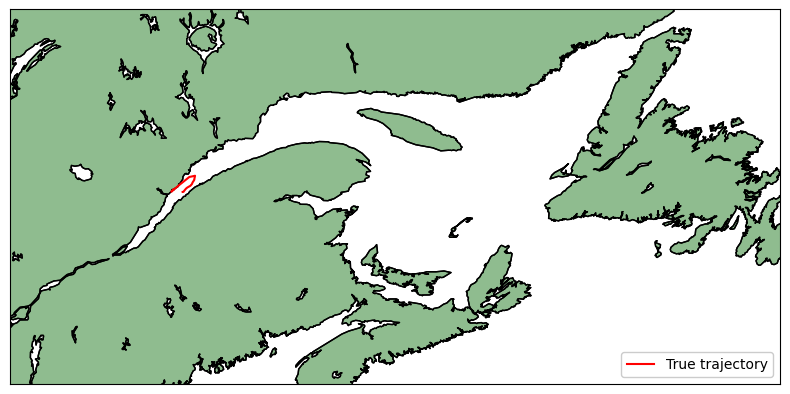

Opening  trace_ISMER_20150813_spot900_drift.yml


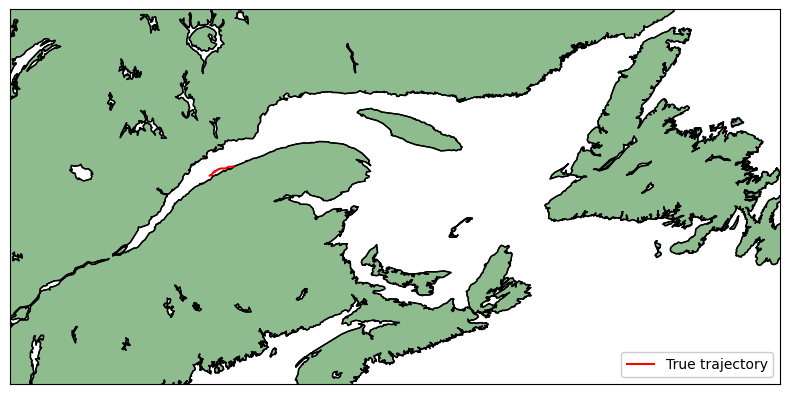

Opening  trace_ISMER_20141027_spot263_drift.yml


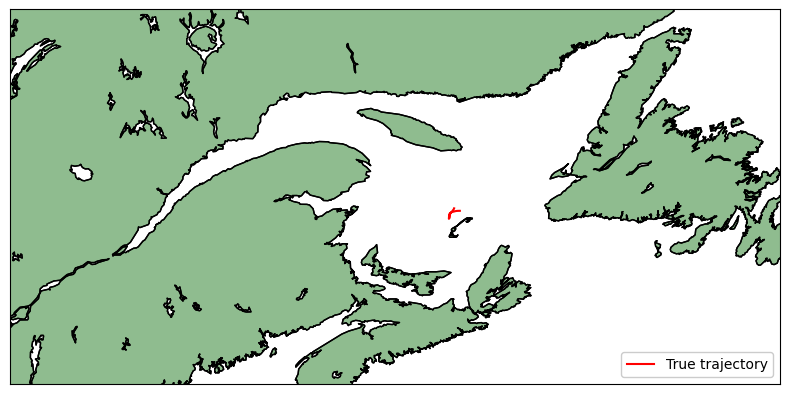

Opening  trace_ISMER_20141022_spot063_drift.yml


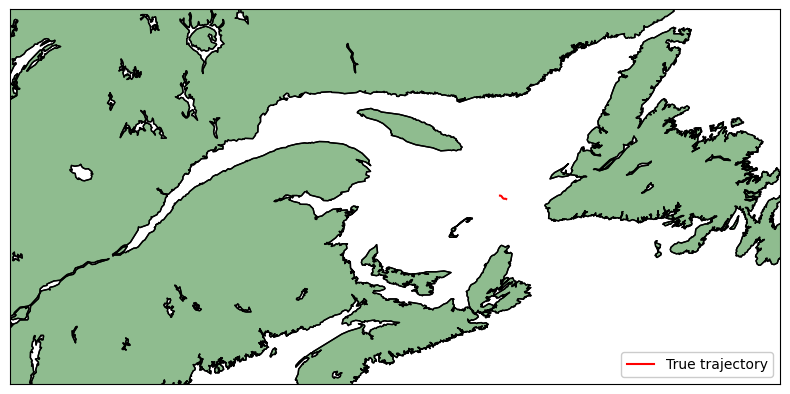

Opening  trace_ISMER_20150615_spot078_drift.yml


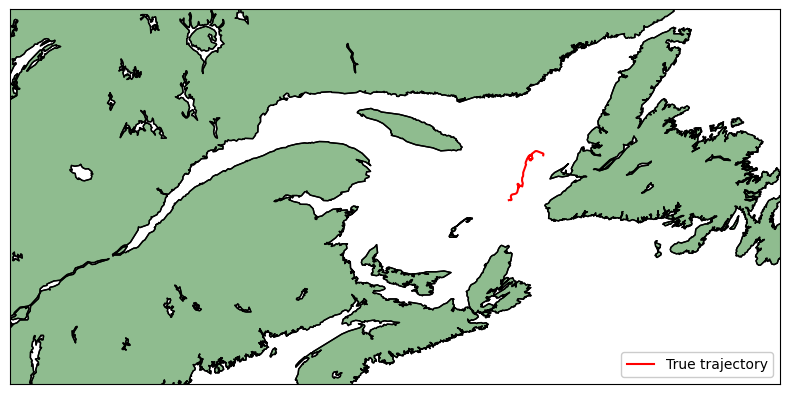

Opening  trace_ISMER_20141024_spot279_drift.yml


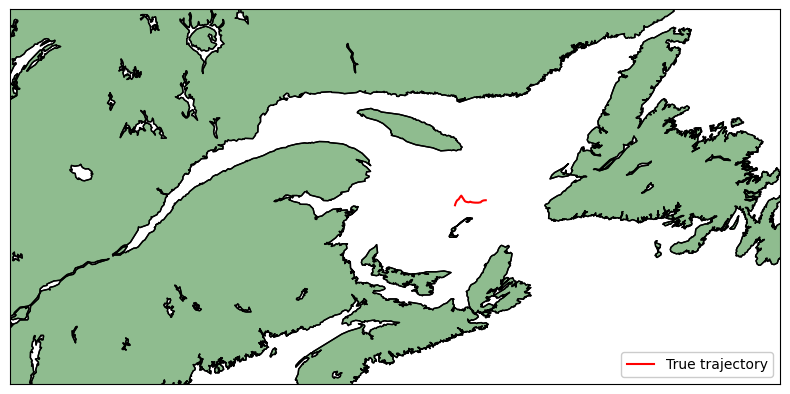

Opening  trace_ISMER_20150611_spot045_drift.yml


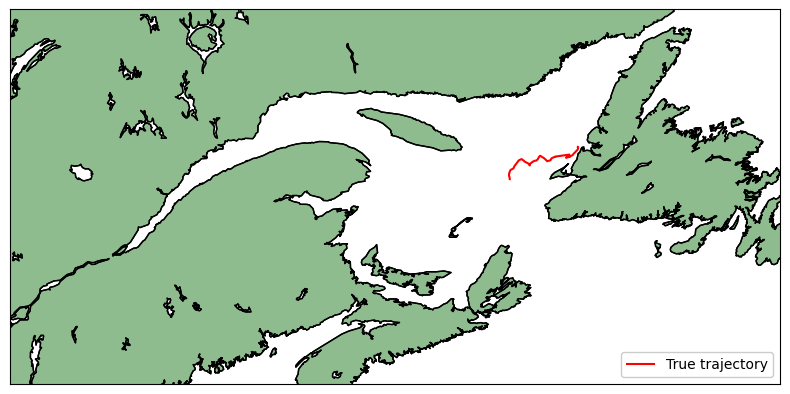

Opening  trace_ISMER_20151013_spot057_drift.yml


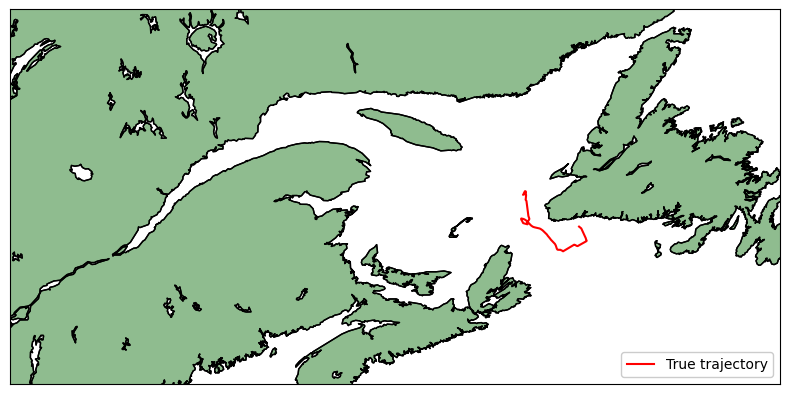

Opening  trace_ISMER_20141027_spot665_drift.yml


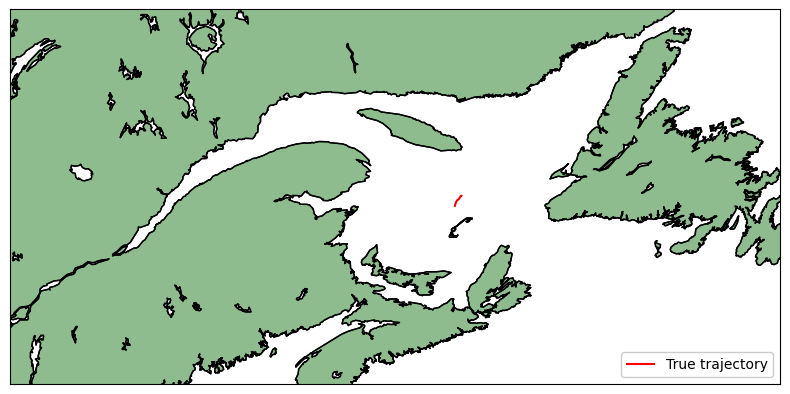

Opening  trace_ISMER_20150924_spot714_drift.yml


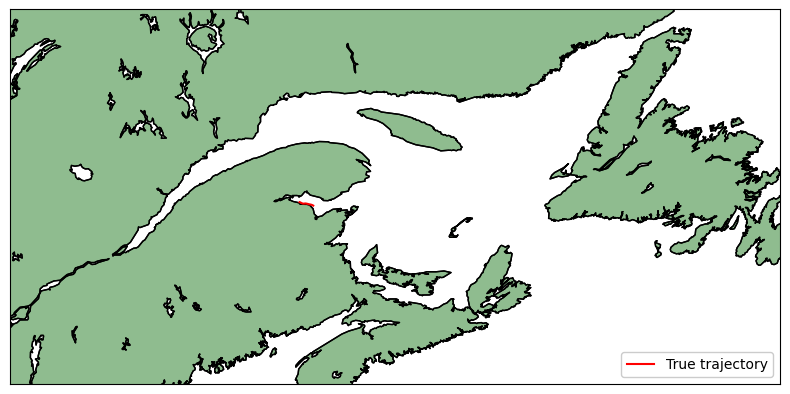

Opening  trace_ISMER_20141027_spot065_drift.yml


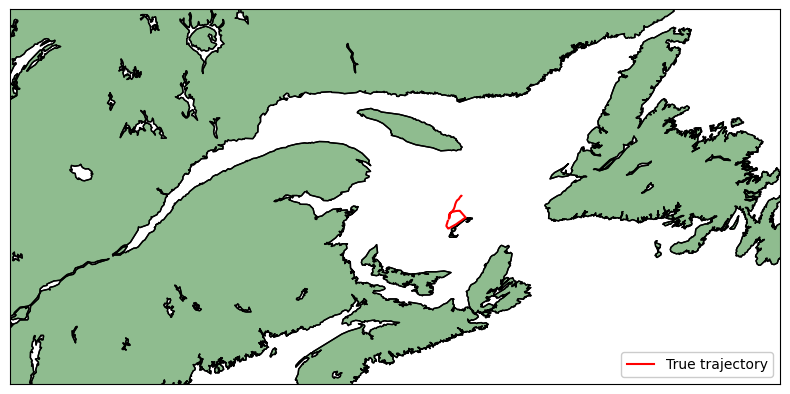

Opening  trace_ISMER_20140811_spot201_drift.yml


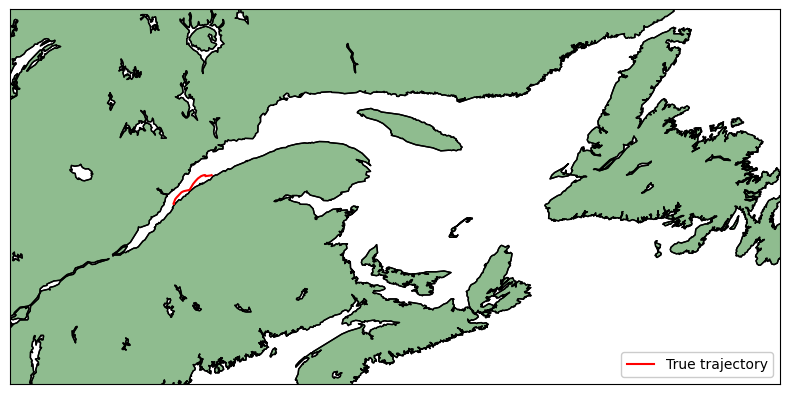

Opening  trace_ISMER_20141021_spot029_drift.yml


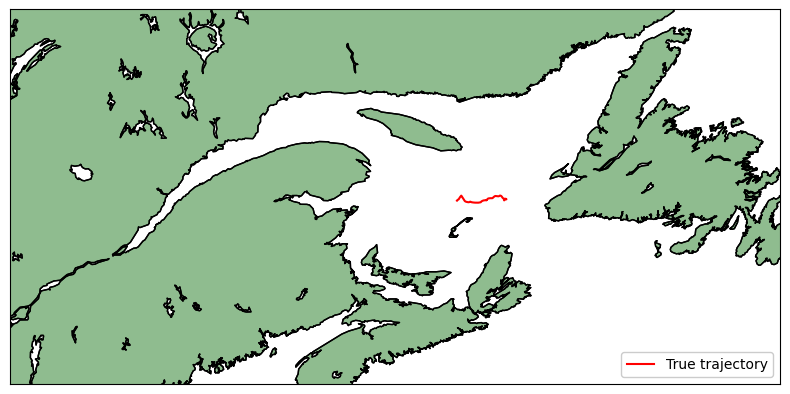

Opening  trace_ISMER_20150615_spot079_drift.yml


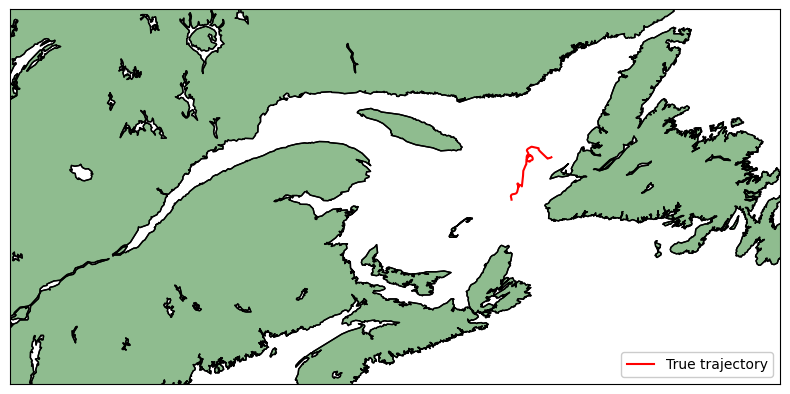

Opening  trace_ISMER_20140707_spot076_drift.yml


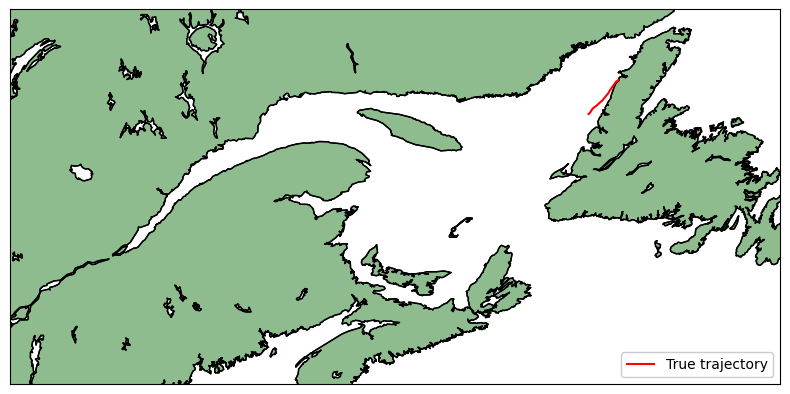

Opening  trace_ISMER_20140629_spot231_drift.yml


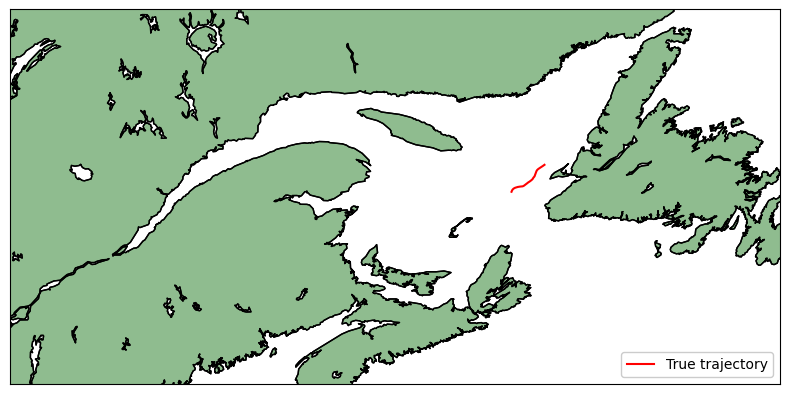

Opening  trace_ISMER_20141021_spot213_drift.yml


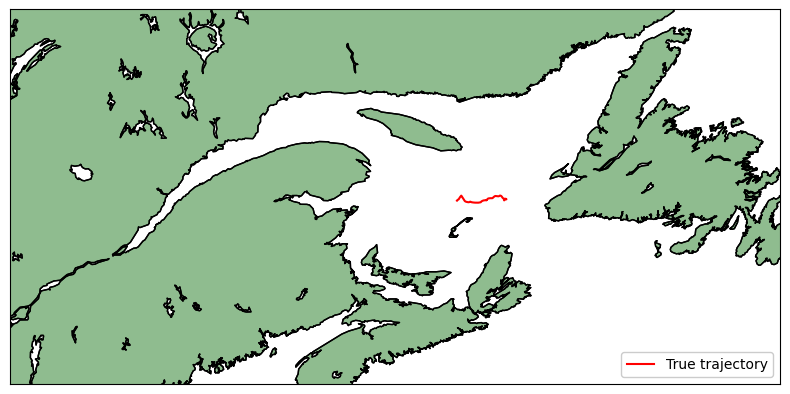

Opening  trace_ISMER_20150809_spot916_drift.yml


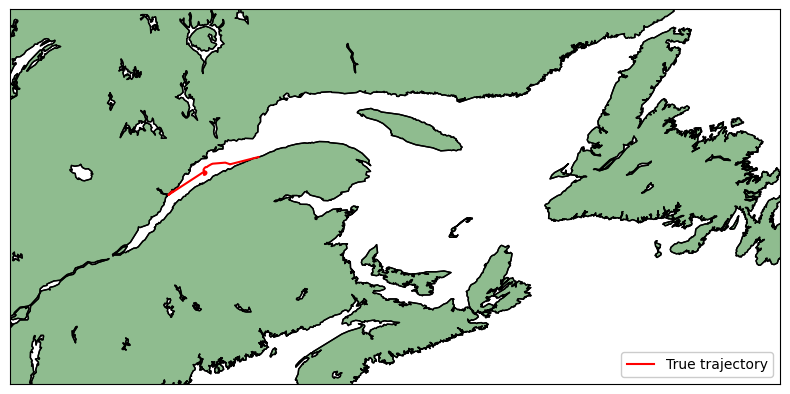

Opening  trace_ISMER_20140702_spot216_drift.yml


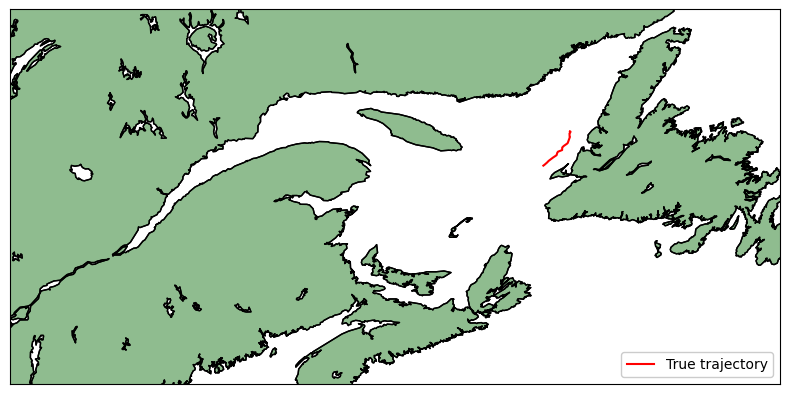

Opening  trace_ISMER_20150614_spot039_drift.yml


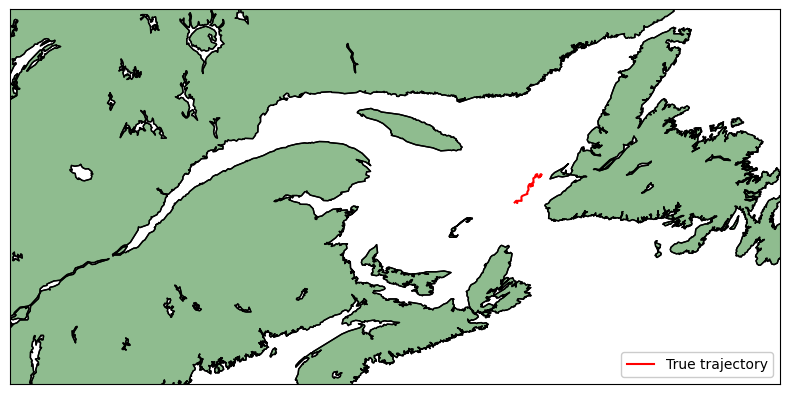

Opening  trace_ISMER_20141031_spot070_drift.yml


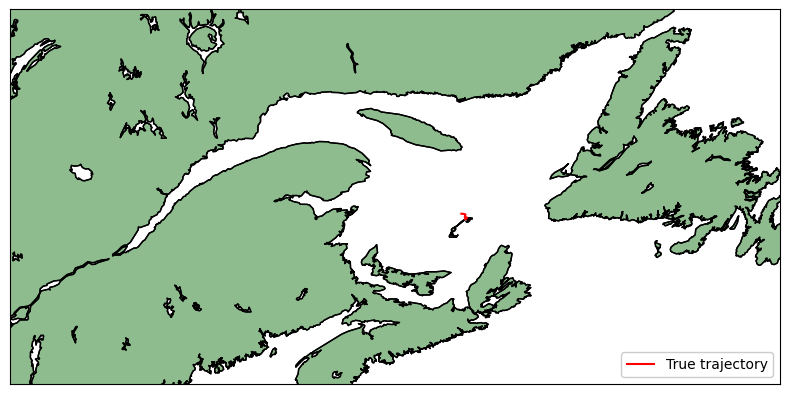

Opening  trace_ISMER_20141024_spot262_drift.yml


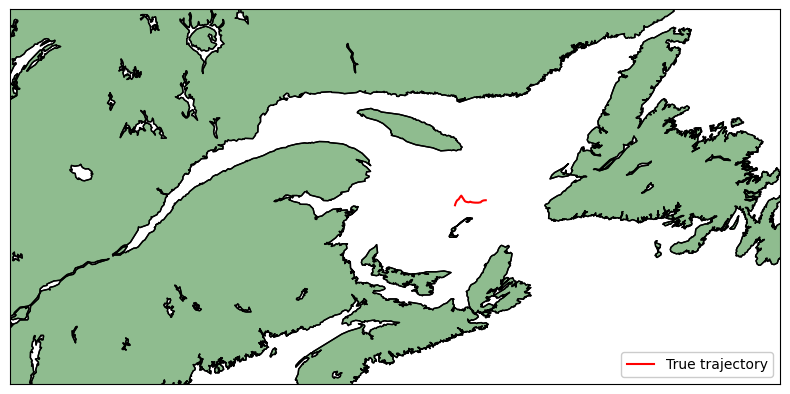

Opening  trace_ISMER_20140924_spot002_drift.yml


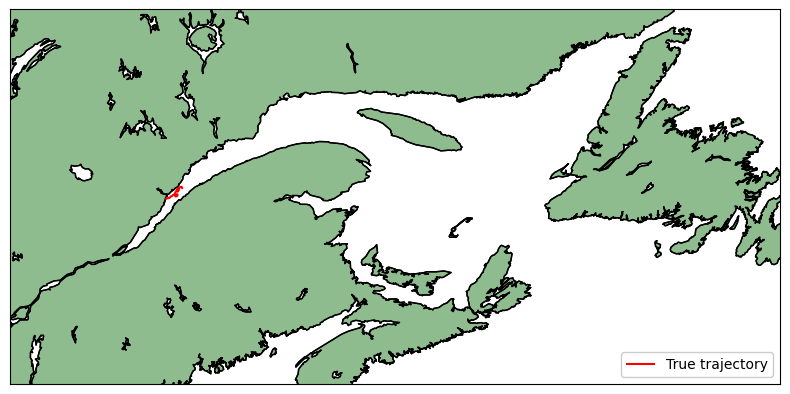

Opening  trace_ISMER_20140629_spot220_drift.yml


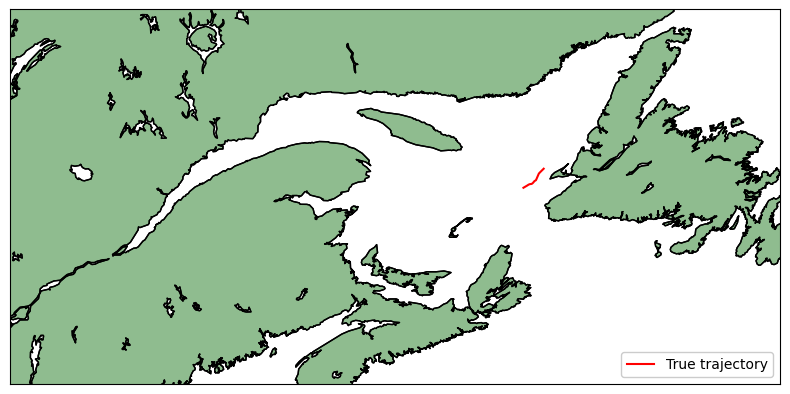

Opening  trace_ISMER_20150624_spot043_drift.yml


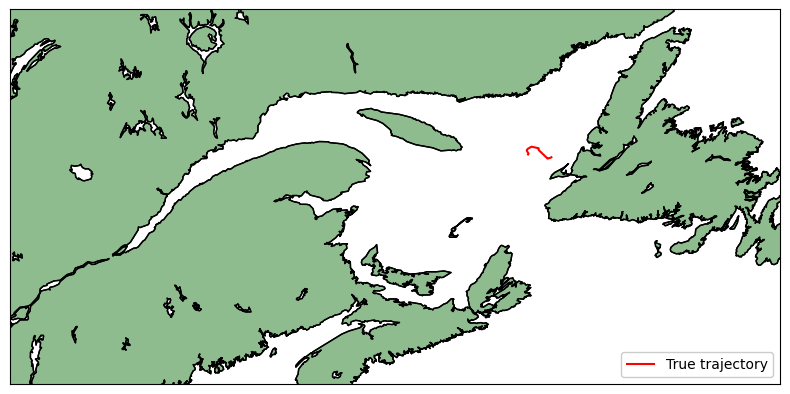

Opening  trace_ISMER_20141027_spot278_drift.yml


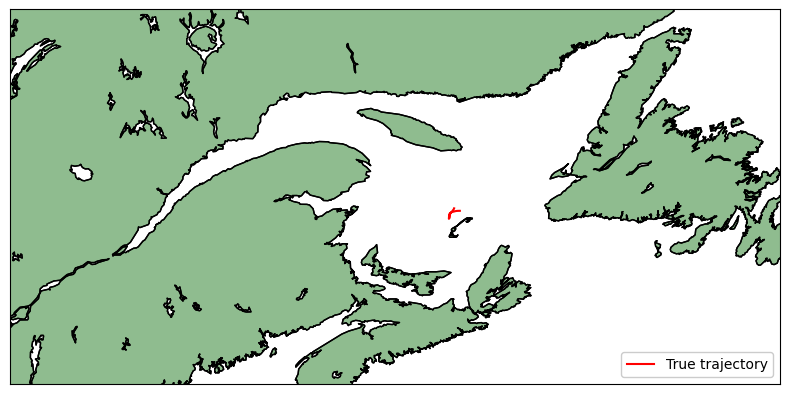

Opening  trace_ISMER_20150809_spot058_drift.yml


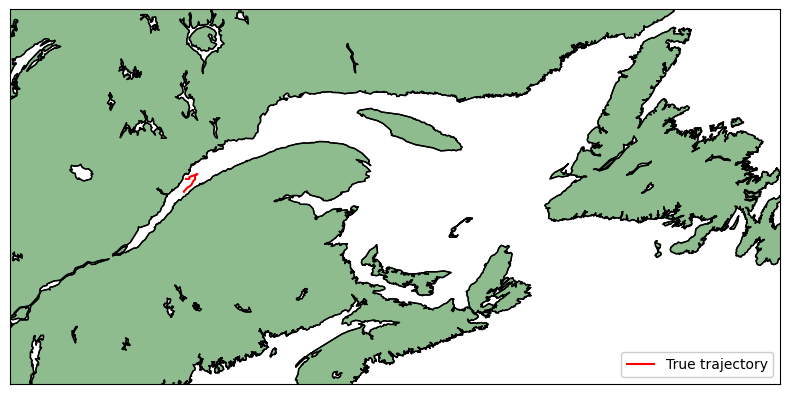

Opening  trace_ISMER_20150812_spot204_drift.yml


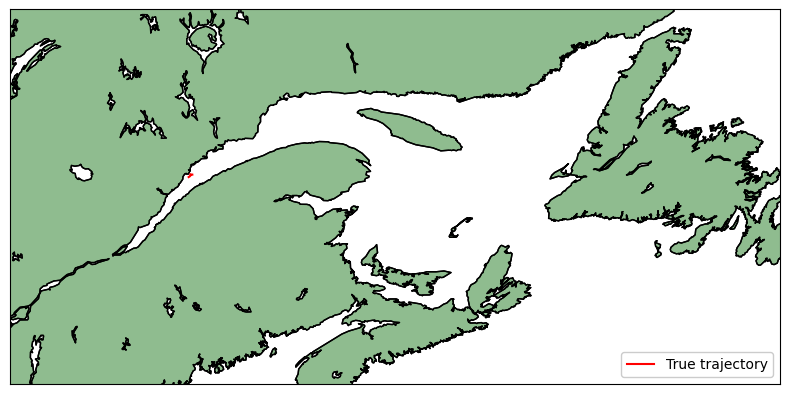

Opening  trace_ISMER_20141027_spot238_drift.yml


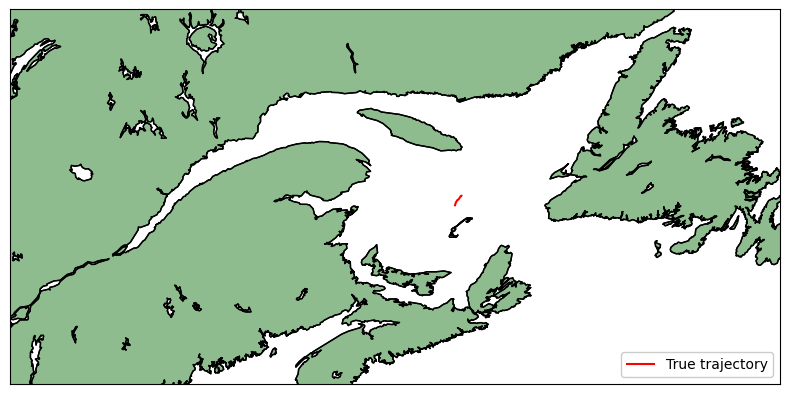

Opening  trace_ISMER_20150813_spot927_drift.yml


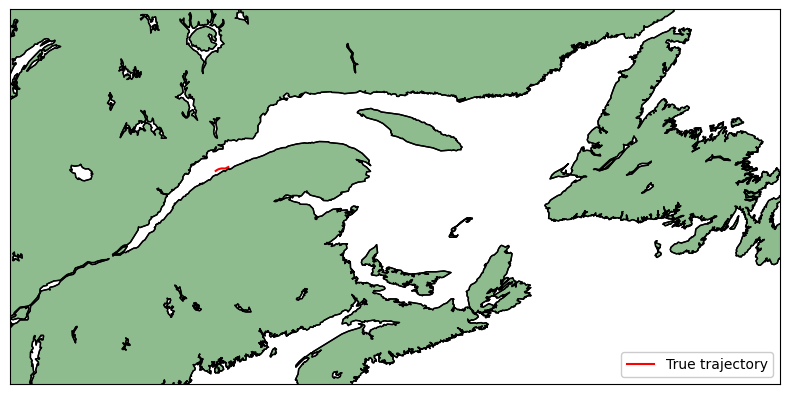

Opening  trace_ISMER_20150809_spot046_drift.yml


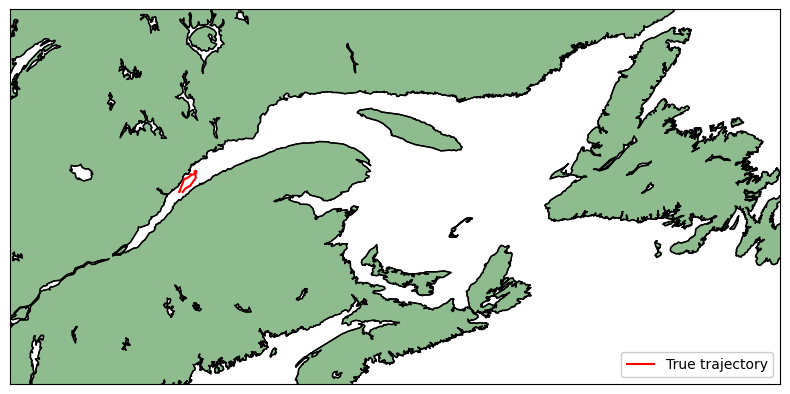

Opening  trace_ISMER_20150924_spot913_drift.yml


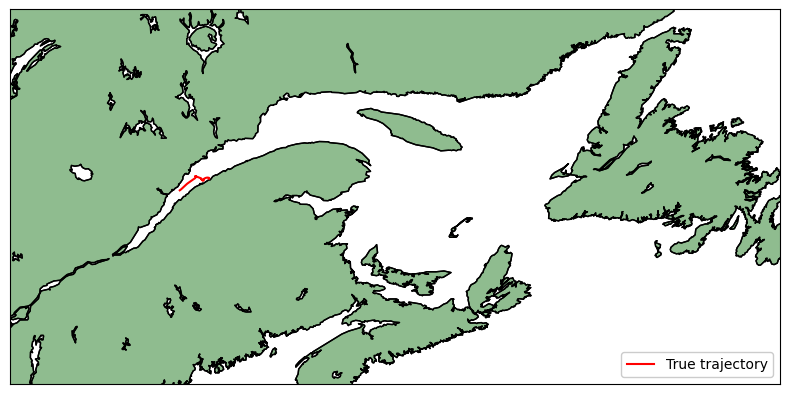

Opening  trace_ISMER_20150925_spot718_drift.yml


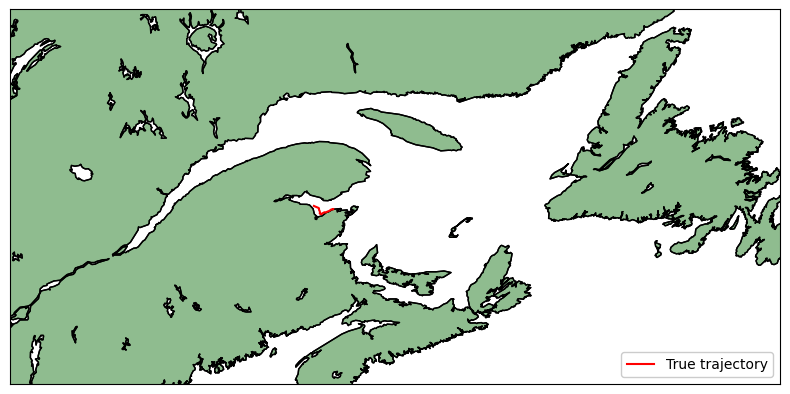

Opening  trace_ISMER_20150921_spot052_drift.yml


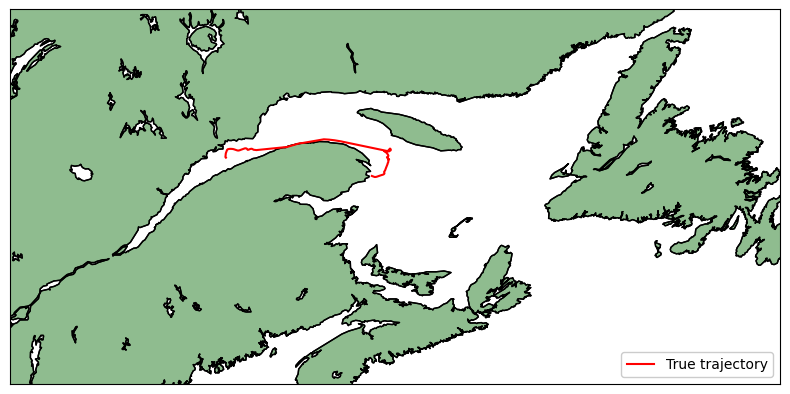

Opening  trace_ISMER_20150611_spot024_drift.yml


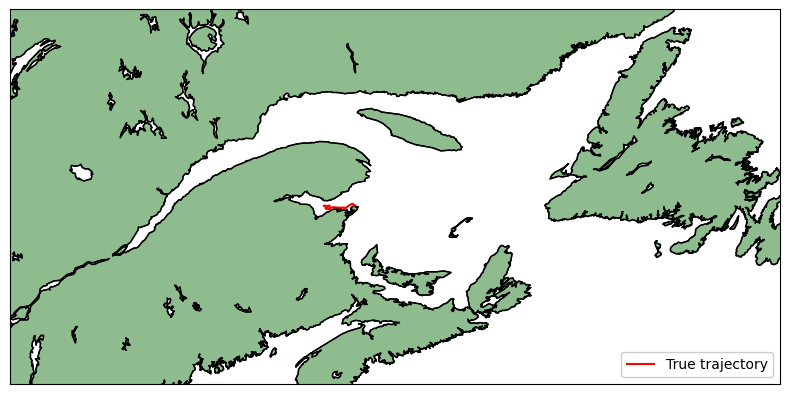

Opening  trace_ISMER_20140709_spot205_drift.yml


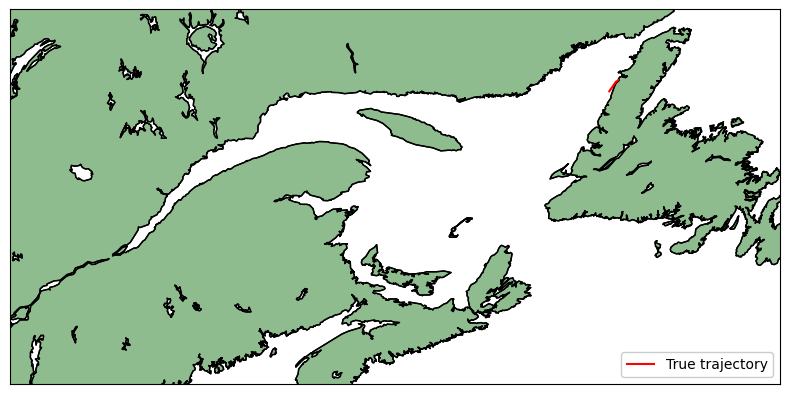

Opening  trace_ISMER_20140926_spot003_drift.yml


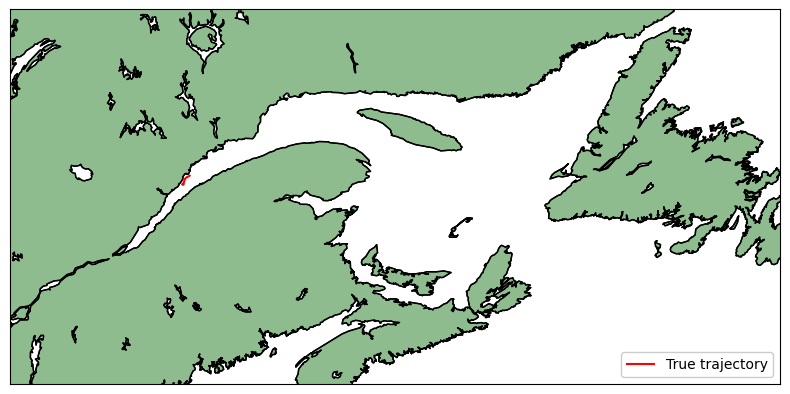

Opening  trace_ISMER_20140830_spot061_drift.yml


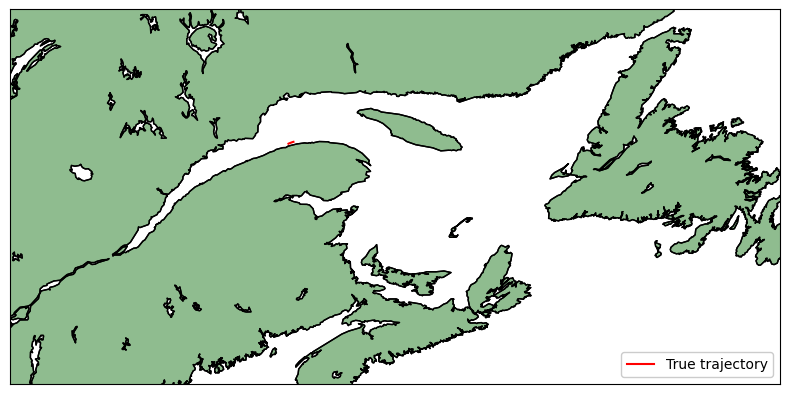

Opening  trace_ISMER_20140901_spot013_drift.yml


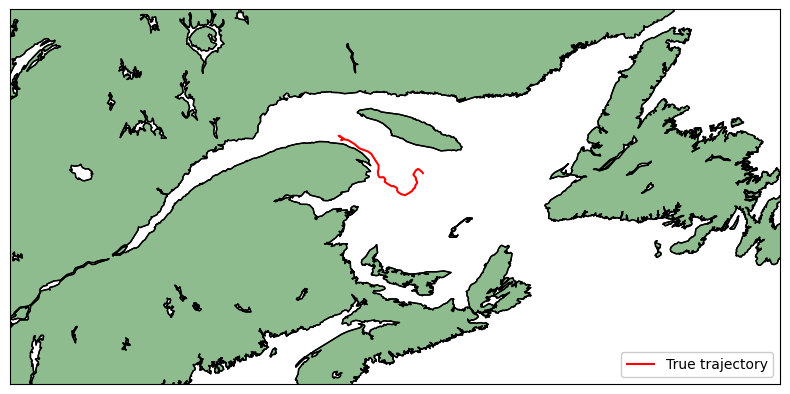

In [1]:
from data_processing.check_data import check_near_shore_data

check_near_shore_data()

# FIgure avec 3 trajectoires differentes sur la meme figure

In [2]:
with open('../configs/configs_NOAA/train/config_traj_300234064873080.yml', 'r') as f:
    config1 = yaml.safe_load(f)

'''with open('../configs/configs_NOAA/train/config_traj_300234066316450.yml', 'r') as f: #ev ../configs/configs_NOAA/test/config_traj_106522.yml
    config2 = yaml.safe_load(f)'''

with open('../configs/configs_NOAA/test/config_traj_300234065417160.yml', 'r') as f:
    config2 = yaml.safe_load(f)

with open('../configs/configs_NOAA/train/config_traj_300234062833790.yml', 'r') as f: #ev: train/config_traj_39616.yml
    config3 = yaml.safe_load(f)

checkpoint_path = '../checkpoints/NOAA/gridsearch/lightning_logs/version_31/checkpoints/epoch=136-step=232215.ckpt'

config1['checkpoint_test'] = checkpoint_path
config1['d_context'] = 50
config1['npoints'] = 32

config2['checkpoint_test'] = checkpoint_path
config2['d_context'] = 50
config2['npoints'] = 32

config3['checkpoint_test'] = checkpoint_path
config3['d_context'] = 50
config3['npoints'] = 32

In [3]:
longitudes_dd1, latitudes_dd1 = compute_trajectory_hybrid(config1,72, NOAA=True)
longitudes_dd2, latitudes_dd2 = compute_trajectory_hybrid(config2,72, NOAA=True)
longitudes_dd3, latitudes_dd3 = compute_trajectory_hybrid(config3,72, NOAA=True)


/home/manon/miniconda3/envs/drift/lib/python3.8/site-packages/torch/cuda/__init__.py:611: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/home/manon/miniconda3/envs/drift/lib/python3.8/site-packages/torch/cuda/__init__.py:740: UserWarning: CUDA initialization: Unexpected error from cudaGetDeviceCount(). Did you run some cuda functions before calling NumCudaDevices() that might have already set an error? Error 804: forward compatibility was attempted on non supported HW (Triggered internally at ../c10/cuda/CUDAFunctions.cpp:108.)
  return torch._C._cuda_getDeviceCount() if nvml_count < 0 else nvml_count
  0%|          | 0/72 [00:00<?, ?it/s]


RuntimeError: Unexpected error from cudaGetDeviceCount(). Did you run some cuda functions before calling NumCudaDevices() that might have already set an error? Error 804: forward compatibility was attempted on non supported HW

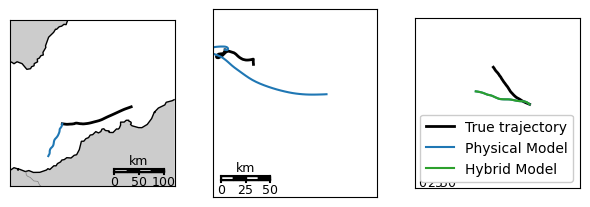

In [8]:
fig, axes = plt.subplots(1, 3, figsize=(6,5))

#=======================================================================================================================================================================================================================================
pos_1, time1 = get_initial_position(config3['PATH_DRIFT'], NOAA=True) 

true_lon, true_lat, true_time = get_true_drift_positions(config3['PATH_DRIFT'], NOAA=True)
nhours = get_number_hours(true_time)

# Get interpolated initial data
u10_interpolation, v10_interpolation = wind_interpolated(config3['PATH_WIND'])
water_u_interpolation, water_v_interpolation = water_interpolated(config3['PATH_WATER'])

# GRADIENT DESCENT ALPHA
alpha = update_alpha_GD(config3['PATH_DRIFT'], water_u_interpolation, water_v_interpolation, u10_interpolation, v10_interpolation,alpha = 0.02, theta = 0.349066,  step=0.1, npoints=3, NOAA=True)

# Drift velocity functions
u_drift = u_drift_linear_matrix(alpha, u10_interpolation, v10_interpolation,water_u_interpolation,water_v_interpolation)

longitudes, latitudes, _ = compute_position(u_drift, pos_1, time1,1,nhours)

m = Basemap(projection = 'mill', llcrnrlat = config3['min_lat']+0.85, urcrnrlat = config3['max_lat']-0.5, llcrnrlon = config3['min_lon']+0.5, urcrnrlon = config3['max_lon']-0.5, resolution = 'i',ax=axes[0]) 

m.drawcoastlines()
m.drawcountries(color='gray')
m.drawstates(color='gray')
m.fillcontinents()

m.plot(true_lon,true_lat,latlon=True,linewidth=2,color='k', label='True trajectory')
m.plot(longitudes,latitudes,latlon=True,linewidth=1.5, label=r'Model A')
#m.plot(longitudes_dd3,latitudes_dd3,latlon=True,linewidth=1.5,color='tab:green', label=r'Model K')

m.drawmapscale(config3['max_lon']-1.15, config3['min_lat']+1.1, config3['min_lon'], config3['min_lat'], 100, barstyle='fancy')

#=======================================================================================================================================================================================================================================
pos_1, time1 = get_initial_position(config2['PATH_DRIFT'], NOAA=True) 

true_lon, true_lat, true_time = get_true_drift_positions(config2['PATH_DRIFT'], NOAA=True)
nhours = get_number_hours(true_time)

# Get interpolated initial data
u10_interpolation, v10_interpolation = wind_interpolated(config2['PATH_WIND'])
water_u_interpolation, water_v_interpolation = water_interpolated(config2['PATH_WATER'])

# GRADIENT DESCENT ALPHA
alpha = update_alpha_GD(config2['PATH_DRIFT'], water_u_interpolation, water_v_interpolation, u10_interpolation, v10_interpolation,alpha = 0.02, theta = 0.349066,  step=0.1, npoints=3, NOAA=True)

# Drift velocity functions
u_drift = u_drift_linear_matrix(alpha, u10_interpolation, v10_interpolation,water_u_interpolation,water_v_interpolation)

longitudes, latitudes, _ = compute_position(u_drift, pos_1, time1,1,nhours)

m = Basemap(projection = 'mill', llcrnrlat = config2['min_lat']+0.5, urcrnrlat = config2['max_lat']-1, llcrnrlon = config2['min_lon']+1, urcrnrlon = config2['max_lon']-0.5, resolution = 'i',ax=axes[1]) 

m.drawcoastlines()
m.drawcountries(color='gray')
m.drawstates(color='gray')
m.fillcontinents()

m.plot(true_lon,true_lat,latlon=True,linewidth=2,color='k', label='True trajectory')
m.plot(longitudes,latitudes,latlon=True,linewidth=1.5, label=r'Model A')
#m.plot(longitudes_dd2,latitudes_dd2,latlon=True,linewidth=1.5,color='tab:green', label=r'Model K')

m.drawmapscale(config2['min_lon']+1.3, config2['min_lat']+0.65, config2['min_lon'], config2['min_lat'], 50, barstyle='fancy')

#=======================================================================================================================================================================================================================================
pos_1, time1 = get_initial_position(config1['PATH_DRIFT'], NOAA=True) 

true_lon, true_lat, true_time = get_true_drift_positions(config1['PATH_DRIFT'], NOAA=True)
nhours = get_number_hours(true_time)

# Get interpolated initial data
u10_interpolation, v10_interpolation = wind_interpolated(config1['PATH_WIND'])
water_u_interpolation, water_v_interpolation = water_interpolated(config1['PATH_WATER'])

# GRADIENT DESCENT ALPHA
alpha = update_alpha_GD(config1['PATH_DRIFT'], water_u_interpolation, water_v_interpolation, u10_interpolation, v10_interpolation,alpha = 0.02, theta = 0.349066,  step=0.1, npoints=3, NOAA=True)

# Drift velocity functions
u_drift = u_drift_linear_matrix(alpha, u10_interpolation, v10_interpolation,water_u_interpolation,water_v_interpolation)

longitudes, latitudes, _ = compute_position(u_drift, pos_1, time1,1,nhours)

m = Basemap(projection = 'mill', llcrnrlat = config1['min_lat']+0.5, urcrnrlat = config1['max_lat']-0.5, llcrnrlon = config1['min_lon']+0.6, urcrnrlon = config1['max_lon']-0.5, resolution = 'i',ax=axes[2]) 

m.drawcoastlines()
m.drawcountries(color='gray')
m.drawstates(color='gray')
m.fillcontinents()

m.plot(true_lon,true_lat,latlon=True,linewidth=2,color='k', label='True trajectory')
m.plot(longitudes,latitudes,latlon=True,linewidth=1.5, label=r'Physical Model')
m.plot(longitudes,latitudes,latlon=True,linewidth=1.5,color='tab:green', label=r'Hybrid Model')

m.drawmapscale(config1['min_lon']+0.95, config1['min_lat']+0.8, config1['min_lon'], config1['min_lat'], 50, barstyle='fancy')

plt.legend(loc = 'lower right',framealpha=1)
#plt.show()
plt.tight_layout()
plt.savefig('figures/traces_hybrid.png') #, format='eps')
